In [1]:
#%%jupyter_template init
from jupyter_template import magic
magic.init(lambda _=globals: _())

In [2]:
%%jupyter_template code_exec
meta_data_filename = "{{ FileField(name='meta_data_filename', label='meta_data_filename', default='metadata_GSE147507.csv', description='Upload metadata as two-column csv format. One column contains sample ids and the other column contains sample labels').value }}"
rnaseq_data_filename = "{{ FileField(name='rnaseq_data_filename', label='rnaseq_data_filename', default='GSE147507_RawReadCounts_Human.tsv', description='Upload rna-seq dataset as csv format. The index of the dataset are genes, the columns are samples.').value }}"

meta_class_column_name = "{{ StringField(name='meta_class_column_name', label='meta_class_column_name', default='CLASS', description='class column name of metadata').value }}"
meta_id_column_name = "{{ StringField(name='meta_id_column_name', label='meta_id_column_name', default='SAMPLE_ID', description='sample ID column name of metadata').value }}"

filter_genes = {{ BoolField(name='filter_genes', label='filter_genes', default='true', description='Check if User wants the dataset to be log-transformed').value }}
low_expression_threshold = {{ FloatField(name='low_expression_threshold', label='low_expression_threshold', default='0.3', description='Threshold to filter out low expression genes. The value should vary based on the user dataset.').value }}

#rnaseq_normalized_output_filename = "{{ StringField(name='rnaseq_normalized_output_filename', label='rnaseq_normalized_output_filename', default='rnaseq_normalized.csv', description='if user wants to download the normalized dataset, please name of the output file.').value }}"
log_normalization = {{ BoolField(name='log_normalization', label='log_normalization', default='true', description='Check if User wants the dataset to be log-transformed').value }}
z_normalization = {{ BoolField(name='z_normalization', label='z_normalization', default='true', description='Check if User wants the dataset to be normalized with Z-normalized method').value }}
q_normalization = {{ BoolField(name='q_normalization', label='q_normalization', default='true', description='Check if User wants the dataset to be normalized with Quantile normalization method').value }}


clustering_topk = {{ IntField(name='clustering_topk', label='clustering_topk', default=800, description='The number of genes with largest variance for Clustergrammer').value }}
expr_df_sub_file = "{{ StringField(name='expr_df_sub_file', label='expr_df_sub_file', default='expr_df_sub_file.txt', description='Save the dataset of clustering_topk genes for Clustergrammer').value }}"

cd_diff_gene_topk = {{ IntField(name='cd_diff_gene_topk', label='cd_diff_gene_topk', default=600, description='The maximum number of genes discovered by the Characteristic Direction method').value }}
l1000cds2_topk = {{ IntField(name='l1000cds2_topk', label='l1000cds2_topk', default=2000, description='The number of genes to be queried to L1000CDS2').value }}
pvalue_threshold = {{ FloatField(name='pvalue_threshold', label='pvalue_threshold', default='0.05', description='Threshold to highlight significantly differentially expressed genes.').value }}
logfc_threshold = {{ FloatField(name='logfc_threshold', label='logfc_threshold', default='1.5', description='Threshold to highlight diffentially expressed genes.').value }}
nr_genes = {{ IntField(name='nr_genes', label='nr_genes', default=500, description='The maximum number of genes discovered by the Characteristic Direction method').value }}

```python
meta_data_filename = "metadata_GSE147507.csv"
rnaseq_data_filename = "GSE147507_RawReadCounts_Human.tsv"
meta_class_column_name = "CLASS"
meta_id_column_name = "SAMPLE_ID"
filter_genes = True
low_expression_threshold = 0.3
#rnaseq_normalized_output_filename = "rnaseq_normalized.csv"
log_normalization = True
z_normalization = True
q_normalization = True
clustering_topk = 800
expr_df_sub_file = "expr_df_sub_file.txt"
cd_diff_gene_topk = 600
l1000cds2_topk = 2000
pvalue_threshold = 0.05
logfc_threshold = 1.5
nr_genes = 500
```

In [3]:
meta_class2_column_name = "TREATMENT"

In [4]:
import pandas as pd
import os
import urllib3
import requests, json
import sys

import geode

import plotly
from plotly import tools
import plotly.express as px
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()
import plotly.io as pio; pio.renderers.default = 'notebook'

import matplotlib.pyplot as plt; plt.rcdefaults()
from matplotlib import rcParams
from matplotlib.lines import Line2D
from matplotlib_venn import venn2, venn3
%matplotlib inline

import IPython
from IPython.display import HTML, display, Markdown, IFrame

from scipy.spatial.distance import cosine
from itertools import combinations

from statsmodels.sandbox.stats.multicomp import multipletests
from mpl_toolkits.mplot3d import proj3d
from mpl_toolkits.mplot3d import Axes3D

import scipy.cluster.hierarchy as sch
import scipy.spatial.distance as dist
from scipy.stats import f_oneway
from scipy.stats.mstats import zscore

from sklearn import manifold
from sklearn.decomposition import PCA
from sklearn.preprocessing import quantile_transform

import xlwt
# import openpyxl as px
from collections import OrderedDict
import random
from time import sleep
import time
import operator
import numpy as np
from math import sqrt

import warnings
warnings.filterwarnings('ignore')
random.seed(0)

from rpy2 import robjects
from rpy2.robjects import r, pandas2ri
pandas2ri.activate()
plot_type='static'
import chart_studio
import chart_studio.plotly as py
chart_studio.tools.set_credentials_file(username='mjjeon', api_key='v0rpMa6lhST28Sq7XqtM')

# Load datasets

In [5]:
expr_df = pd.read_csv(rnaseq_data_filename, index_col=0, sep="\t")
meta_df = pd.read_csv(meta_data_filename)

In [6]:
print(meta_df)

         GEO_ID                        SAMPLE_ID
0    GSM4432378              Series1_NHBE_Mock_1
1    GSM4432379              Series1_NHBE_Mock_2
2    GSM4432380              Series1_NHBE_Mock_3
3    GSM4432381        Series1_NHBE_SARS-CoV-2_1
4    GSM4432382        Series1_NHBE_SARS-CoV-2_2
..          ...                              ...
96   GSM4462412  Series14_FerretTrachea_IAV_d3_6
97   GSM4462413     Series15_HealthyLungBiopsy_1
98   GSM4462414     Series15_HealthyLungBiopsy_2
99   GSM4462415           Series15_COVID19Lung_1
100  GSM4462416           Series15_COVID19Lung_2

[101 rows x 2 columns]


### Filterout some labels

In [7]:
groups = list()
labels = list()
treatments = list()
for row in meta_df["SAMPLE_ID"].str.split("_"):
    group = "_".join([row[0], row[1]])
    treatment = row[2]
    label = "_".join([row[0], row[1], row[2]])
    groups.append(group)
    labels.append(label)
    treatments.append(treatment)
meta_df["GROUP"] = groups
meta_df[meta_class_column_name] = labels
meta_df[meta_class2_column_name] = treatments

meta_df = meta_df[~meta_df[meta_class_column_name].str.contains("Series15")]
meta_df = meta_df[(meta_df[meta_class2_column_name].str.contains("Mock")) | (meta_df[meta_class2_column_name].str.contains("SARS-CoV-2"))]

In [8]:
meta_df

,GEO_ID,SAMPLE_ID,GROUP,CLASS,TREATMENT
0,GSM4432378,Series1_NHBE_Mock_1,Series1_NHBE,Series1_NHBE_Mock,Mock
1,GSM4432379,Series1_NHBE_Mock_2,Series1_NHBE,Series1_NHBE_Mock,Mock
2,GSM4432380,Series1_NHBE_Mock_3,Series1_NHBE,Series1_NHBE_Mock,Mock
3,GSM4432381,Series1_NHBE_SARS-CoV-2_1,Series1_NHBE,Series1_NHBE_SARS-CoV-2,SARS-CoV-2
4,GSM4432382,Series1_NHBE_SARS-CoV-2_2,Series1_NHBE,Series1_NHBE_SARS-CoV-2,SARS-CoV-2
5,GSM4432383,Series1_NHBE_SARS-CoV-2_3,Series1_NHBE,Series1_NHBE_SARS-CoV-2,SARS-CoV-2
6,GSM4432384,Series2_A549_Mock_1,Series2_A549,Series2_A549_Mock,Mock
7,GSM4432385,Series2_A549_Mock_2,Series2_A549,Series2_A549_Mock,Mock
8,GSM4432386,Series2_A549_Mock_3,Series2_A549,Series2_A549_Mock,Mock
9,GSM4432387,Series2_A549_SARS-CoV-2_1,Series2_A549,Series2_A549_SARS-CoV-2,SARS-CoV-2


In [9]:
# Match samples between the metadata and the datasets
meta_df = meta_df[meta_df[meta_id_column_name].isin(expr_df.columns)]
expr_df = expr_df.loc[:,meta_df[meta_id_column_name]]

assert(meta_df.shape[0]==expr_df.shape[1])

## Filter out low expressed genes 

In [10]:
## Filter out non-expressed genes
expr_df = expr_df.loc[expr_df.sum(axis=1) > 0, :]
print (expr_df.shape)

if filter_genes == True: 
    ## Filter out lowly expressed genes
    mask_low_vals = (expr_df > low_expression_threshold).sum(axis=1) > 2
    expr_df = expr_df.loc[mask_low_vals, :]

    print (expr_df.shape)

(19082, 41)
(17960, 41)


In [11]:
display(expr_df.head())

,Series1_NHBE_Mock_1,Series1_NHBE_Mock_2,Series1_NHBE_Mock_3,Series1_NHBE_SARS-CoV-2_1,Series1_NHBE_SARS-CoV-2_2,Series1_NHBE_SARS-CoV-2_3,Series2_A549_Mock_1,Series2_A549_Mock_2,Series2_A549_Mock_3,Series2_A549_SARS-CoV-2_1,...,Series7_Calu3_SARS-CoV-2_1,Series7_Calu3_SARS-CoV-2_2,Series7_Calu3_SARS-CoV-2_3,Series8_A549_Mock_1,Series8_A549_Mock_2,Series8_A549_Mock_3,Series9_NHBE_Mock_1,Series9_NHBE_Mock_2,Series9_NHBE_Mock_3,Series9_NHBE_Mock_4
DDX11L1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
WASH7P,29,24,23,34,19,44,68,43,33,65,...,47,32,41,68,17,21,57,58,53,89
LOC729737,112,119,113,127,84,270,11,3,6,8,...,271,137,265,4,3,5,58,51,44,93
LOC100133331,19,21,36,16,23,54,54,23,20,45,...,14,12,23,9,10,24,8,6,12,10
LOC100288069,13,17,27,19,9,50,23,18,5,30,...,11,4,9,0,6,8,3,0,0,1


In [12]:
display(meta_df.head())

,GEO_ID,SAMPLE_ID,GROUP,CLASS,TREATMENT
0,GSM4432378,Series1_NHBE_Mock_1,Series1_NHBE,Series1_NHBE_Mock,Mock
1,GSM4432379,Series1_NHBE_Mock_2,Series1_NHBE,Series1_NHBE_Mock,Mock
2,GSM4432380,Series1_NHBE_Mock_3,Series1_NHBE,Series1_NHBE_Mock,Mock
3,GSM4432381,Series1_NHBE_SARS-CoV-2_1,Series1_NHBE,Series1_NHBE_SARS-CoV-2,SARS-CoV-2
4,GSM4432382,Series1_NHBE_SARS-CoV-2_2,Series1_NHBE,Series1_NHBE_SARS-CoV-2,SARS-CoV-2


In [13]:
display(meta_df.groupby(meta_class_column_name).count())

,GEO_ID,SAMPLE_ID,GROUP,TREATMENT
CLASS,,,,
Series1_NHBE_Mock,3,3,3,3
Series1_NHBE_SARS-CoV-2,3,3,3,3
Series2_A549_Mock,3,3,3,3
Series2_A549_SARS-CoV-2,3,3,3,3
Series3_A549_Mock,2,2,2,2
Series4_A549_Mock,2,2,2,2
Series5_A549_Mock,3,3,3,3
Series5_A549_SARS-CoV-2,3,3,3,3
Series6_A549-ACE2_Mock,3,3,3,3


In [14]:
def display_link(url):
    raw_html = '<a href="%s" target="_blank">%s</a>' % (url, url)
    return display(HTML(raw_html))

# Differential Expression 

## limma

In [15]:
robjects.r('''limma <- function(rawcount_dataframe, design_dataframe, filter_genes=FALSE, adjust="BH") {
    
    # Load packages
    suppressMessages(require(limma))
    suppressMessages(require(edgeR))

    # Convert design matrix
    design <- as.matrix(design_dataframe)

    # Create DGEList object
    dge <- DGEList(counts=rawcount_dataframe)

    # Filter genes
    if (filter_genes) {
        keep <- filterByExpr(dge, design)
        dge <- dge[keep,]
    }

    # Calculate normalization factors
    dge <- calcNormFactors(dge)

    # Run VOOM
    v <- voom(dge, plot=FALSE)

    # Fit linear model
    fit <- lmFit(v, design)

    # Make contrast matrix
    cont.matrix <- makeContrasts(de=B-A, levels=design)

    # Fit
    fit2 <- contrasts.fit(fit, cont.matrix)

    # Run DE
    fit2 <- eBayes(fit2)

    # Get results
    limma_dataframe <- topTable(fit2, adjust=adjust, number=nrow(rawcount_dataframe))
    limma_dataframe$gene_symbol <- rownames(limma_dataframe)

    # Return
    return(limma_dataframe)
}
''')

R object with classes: ('function',) mapped to:

In [16]:
def plot_2D_scatter(x, y, text='', title='', xlab='', ylab='', hoverinfo='text', color='black', colorscale='Blues', size=8, showscale=False, symmetric_x=False, symmetric_y=False, pad=0.5, hline=False, vline=False, return_trace=False, labels=False, plot_type='interactive', de_type='ma'):
    range_x = [-max(abs(x))-pad, max(abs(x))+pad]if symmetric_x else None
    range_y = [-max(abs(y))-pad, max(abs(y))+pad]if symmetric_y else None
    trace = go.Scattergl(x=x, y=y, mode='markers', text=text, hoverinfo=hoverinfo, marker={'color': color, 'colorscale': colorscale, 'showscale': showscale, 'size': size})
    if return_trace:
        return trace
    else:
        if de_type == 'ma':
            annotations = [
                {'x': 1, 'y': 0.1, 'text':'<span style="color: blue; font-size: 10pt; font-weight: 600;">Down-regulated in '+labels[-1]+'</span>', 'showarrow': False, 'xref': 'paper', 'yref': 'paper', 'xanchor': 'right', 'yanchor': 'top'},
                {'x': 1, 'y': 0.9, 'text':'<span style="color: red; font-size: 10pt; font-weight: 600;">Up-regulated in '+labels[-1]+'</span>', 'showarrow': False, 'xref': 'paper', 'yref': 'paper', 'xanchor': 'right', 'yanchor': 'bottom'}
            ] if labels else []
        elif de_type == 'volcano':
            annotations = [
                {'x': 0.25, 'y': 1.07, 'text':'<span style="color: blue; font-size: 10pt; font-weight: 600;">Down-regulated in '+labels[-1]+'</span>', 'showarrow': False, 'xref': 'paper', 'yref': 'paper', 'xanchor': 'center'},
                {'x': 0.75, 'y': 1.07, 'text':'<span style="color: red; font-size: 10pt; font-weight: 600;">Up-regulated in '+labels[-1]+'</span>', 'showarrow': False, 'xref': 'paper', 'yref': 'paper', 'xanchor': 'center'}
            ] if labels else []
        layout = go.Layout(title=title, xaxis={'title': xlab, 'range': range_x}, yaxis={'title': ylab, 'range': range_y}, hovermode='closest', annotations=annotations)
        fig = go.Figure(data=[trace], layout=layout)
    
    if plot_type == 'interactive':
        plotly.offline.iplot(fig)
    else:
        py.image.ishow(fig)

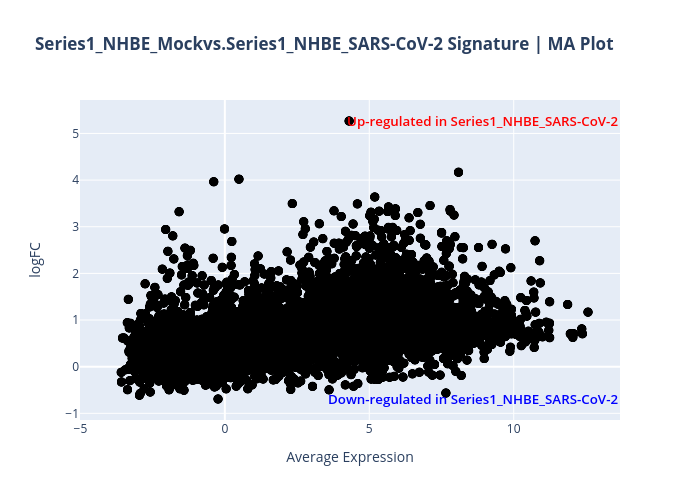

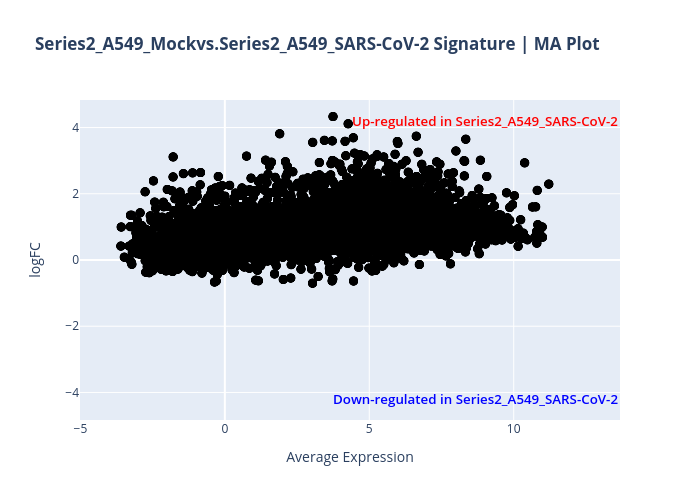

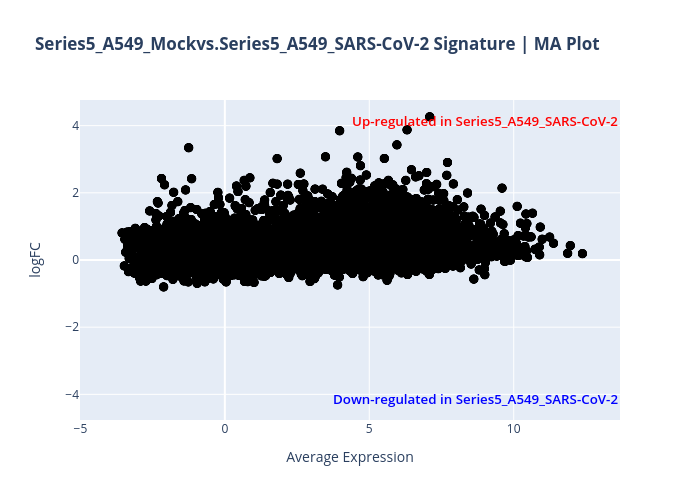

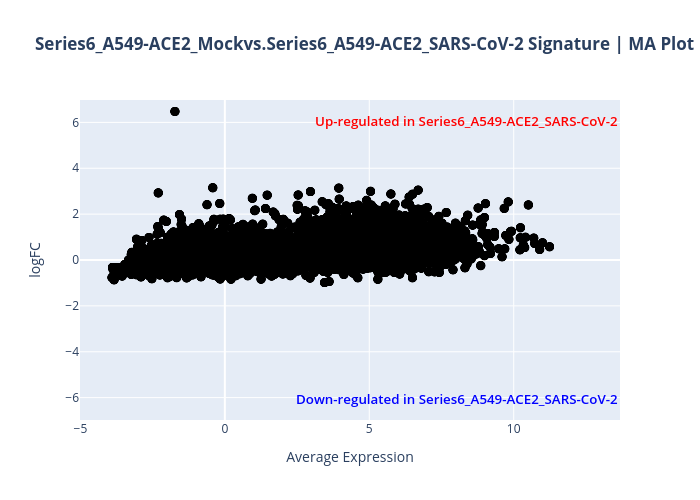

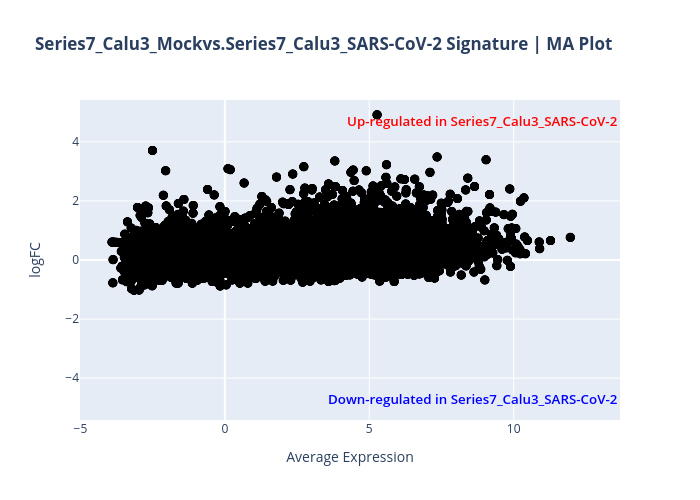

In [17]:
signatures = dict()
classes = meta_df[meta_class_column_name].unique().tolist()
for A, B in combinations(classes, 2):
    if A[:7] != B[:7]:
        continue
    group_A = meta_df.loc[meta_df[meta_class_column_name]==A, "SAMPLE_ID"].tolist()
    group_B = meta_df.loc[meta_df[meta_class_column_name]==B, "SAMPLE_ID"].tolist()
    design_dataframe = pd.DataFrame([{'index': x, 'A': int(x in group_A), 'B': int(x in group_B)} for x in expr_df.columns]).set_index('index')
    
    processed_data = {"expression": expr_df, 'design': design_dataframe}
    
    limma = robjects.r['limma']
    signature = pandas2ri.conversion.rpy2py(limma(pandas2ri.conversion.py2rpy(processed_data['expression']), pandas2ri.conversion.py2rpy(processed_data['design']), filter_genes))
#     signature = pandas2ri.ri2py(limma(pandas2ri.py2ri(processed_data['expression']), pandas2ri.py2ri(processed_data['design']), filter_genes))
    
    
    
    signature_label = "vs.".join([A, B])
    signatures[signature_label] = signature
for A, B in combinations(classes, 2):
    if A[:7] != B[:7]:
        continue
    signature_label = "vs.".join([A, B])
    signature = signatures[signature_label]
    # Loop through signature
    color = []
    text = []
    for index, rowData in signature.iterrows():

        # Text
        text.append('<b>'+index+'</b><br>Avg Expression = '+str(round(rowData['AveExpr'], ndigits=2))+'<br>logFC = '+str(round(rowData['logFC'], ndigits=2))+'<br>p = '+'{:.2e}'.format(rowData['P.Value'])+'<br>FDR = '+'{:.2e}'.format(rowData['adj.P.Val']))

        # Color
        if rowData['adj.P.Val'] < pvalue_threshold:
            if rowData['logFC'] < -logfc_threshold:
                color.append('blue')
            elif rowData['logFC'] > logfc_threshold:
                color.append('red')
            else:
                color.append('black')

        else:
            color.append('black')

    volcano_plot_results = {'x': signature['AveExpr'], 'y': -np.log10(signature['logFC']), 'text':text, 'color': color, 'signature_label': signature_label, 'plot_type': plot_type}
    
    
    plot_2D_scatter(
        x=volcano_plot_results['x'],
        y=volcano_plot_results['y'],
        text=volcano_plot_results['text'],
        color=volcano_plot_results['color'],
        symmetric_y=True,
        xlab='Average Expression',
        ylab='logFC',
        title='<b>{volcano_plot_results[signature_label]} Signature | MA Plot</b>'.format(**locals()),
        labels=volcano_plot_results['signature_label'].split('vs.'),
        plot_type=volcano_plot_results['plot_type']
    )
#     break

## CD

In [18]:
ENRICHR_URL = 'http://amp.pharm.mssm.edu/Enrichr'
def _enrichr_add_list(genes, meta=''):
    """POST a gene list to Enrichr server and return the list ids"""
    genes_str = '\n'.join(genes)
    payload = {
        'list': (None, genes_str),
        'description': (None, meta)
    }
    # POST genes to the /addList endpoint
    response = requests.post("%s/addList" % ENRICHR_URL, files=payload)
    list_ids = json.loads(response.text)
    return list_ids

def enrichr_link(genes, meta=''):
    """POST a gene list to Enrichr server and get the link."""
    list_ids = _enrichr_add_list(genes, meta)
    shortId = list_ids['shortId']
    link = '%s/enrich?dataset=%s' % (ENRICHR_URL, shortId)
    return link

d_platform_cd = {} # to top up/down genes
cd_results = pd.DataFrame(index=expr_df.index)

sample_classes = {}
for layout1 in meta_df[meta_class_column_name].unique():
    for layout2 in meta_df[meta_class_column_name].unique():
        if layout1 != layout2:            
            sample_class = np.zeros(expr_df.shape[1], dtype=np.int32)
            sample_class[meta_df[meta_class_column_name].values == layout1] = 1
            sample_class[meta_df[meta_class_column_name].values == layout2] = 2
            diff_gene_set_name = "vs.".join([layout1, layout2])
            sample_classes[diff_gene_set_name] = sample_class


for platform, sample_class in sample_classes.items():

    expr_df_log_transformed = np.log10(expr_df.values + 1.)
    cd_res = geode.chdir(expr_df_log_transformed, sample_class, expr_df.index, gamma=.5, sort=False, calculate_sig=False)
    cd_coefs = np.array([x[0] for x in cd_res])
    cd_results[platform] = cd_coefs

    # sort CD in by absolute values in descending order
    srt_idx = np.abs(cd_coefs).argsort()[::-1]
    cd_coefs = cd_coefs[srt_idx][:cd_diff_gene_topk]
    sorted_DEGs = expr_df.index[srt_idx][:cd_diff_gene_topk]

    # split up and down
    up_genes = dict(zip(sorted_DEGs[cd_coefs > 0], cd_coefs[cd_coefs > 0]))
    dn_genes = dict(zip(sorted_DEGs[cd_coefs < 0], cd_coefs[cd_coefs < 0]))
    d_platform_cd[platform+'-up'] = up_genes
    d_platform_cd[platform+'-dn'] = dn_genes



# Enrichr

In [19]:
def submit_enrichr_geneset(geneset, label=''):
    ENRICHR_URL = 'http://amp.pharm.mssm.edu/Enrichr/addList'
    genes_str = '\n'.join(geneset)
    payload = {
        'list': (None, genes_str),
        'description': (None, label)
    }
    response = requests.post(ENRICHR_URL, files=payload)
    if not response.ok:
        raise Exception('Error analyzing gene list')
    time.sleep(0.5)
    data = json.loads(response.text)
    return data

def run_enrichr(signature, signature_label, geneset_size=500, sort_genes_by='t'):

    # Sort signature
    signature = signature.sort_values(sort_genes_by, ascending=False)

    # Get genesets
    genesets = {
        'upregulated': signature.index[:geneset_size],
        'downregulated': signature.index[-geneset_size:]
    }

    # Submit to Enrichr
    enrichr_ids = {geneset_label: submit_enrichr_geneset(geneset=geneset, label=signature_label+', '+geneset_label+', from BioJupies') for geneset_label, geneset in genesets.items()}
    enrichr_ids['signature_label'] = signature_label
    return enrichr_ids



In [20]:
# Loop through signatures
results = {}
results['enrichr']= {}
for label, signature in signatures.items():
    # Run analysis
    results['enrichr'][label] = run_enrichr(signature=signature, signature_label=label, geneset_size=500, sort_genes_by='t')
    print(label+"-up")
    display_link("https://amp.pharm.mssm.edu/Enrichr/enrich?dataset={}".format(results['enrichr'][label]["upregulated"]["shortId"]))
    print(label+"-down")
    display_link("https://amp.pharm.mssm.edu/Enrichr/enrich?dataset={}".format(results['enrichr'][label]["downregulated"]["shortId"]))
    

Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2-up


Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2-down


Series2_A549_Mockvs.Series2_A549_SARS-CoV-2-up


Series2_A549_Mockvs.Series2_A549_SARS-CoV-2-down


Series5_A549_Mockvs.Series5_A549_SARS-CoV-2-up


Series5_A549_Mockvs.Series5_A549_SARS-CoV-2-down


Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2-up


Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2-down


Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2-up


Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2-down


# GO

In [21]:


def get_enrichr_results(user_list_id, gene_set_libraries, overlappingGenes=True, geneset=None):
    ENRICHR_URL = 'http://amp.pharm.mssm.edu/Enrichr/enrich'
    query_string = '?userListId=%s&backgroundType=%s'
    results = []
    for gene_set_library, label in gene_set_libraries.items():
        response = requests.get(
                    ENRICHR_URL +
                       query_string % (user_list_id, gene_set_library)
                )
        if not response.ok:
            raise Exception('Error fetching enrichment results')

        data = json.loads(response.text)
        resultDataframe = pd.DataFrame(data[gene_set_library], columns=[
                                       'rank', 'term_name', 'pvalue', 'zscore', 'combined_score', 'overlapping_genes', 'FDR', 'old_pvalue', 'old_FDR'])
        selectedColumns = ['term_name', 'zscore', 'combined_score', 'pvalue', 'FDR'] if not overlappingGenes else [
            'term_name', 'zscore', 'combined_score', 'FDR', 'pvalue', 'overlapping_genes']
        resultDataframe = resultDataframe.loc[:, selectedColumns]
        resultDataframe['gene_set_library'] = label
        resultDataframe['log10P'] = -np.log10(resultDataframe['pvalue'])
        results.append(resultDataframe)
    concatenatedDataframe = pd.concat(results)
    if geneset:
        concatenatedDataframe['geneset'] = geneset
    return concatenatedDataframe


def run_go(enrichr_results, signature_label, plot_type='interactive', go_version='2018', sort_results_by='pvalue'):

    # Libraries
    go_version = str(go_version)
    libraries = {
        'GO_Biological_Process_'+go_version: 'Gene Ontology Biological Process ('+go_version+' version)',
        'GO_Molecular_Function_'+go_version: 'Gene Ontology Molecular Function ('+go_version+' version)',
        'GO_Cellular_Component_'+go_version: 'Gene Ontology Cellular Component ('+go_version+' version)'
    }

    # Get Enrichment Results
    enrichment_results = {geneset: get_enrichr_results(enrichr_results[geneset]['userListId'], gene_set_libraries=libraries, geneset=geneset) for geneset in ['upregulated', 'downregulated']}
    enrichment_results['signature_label'] = signature_label
    enrichment_results['plot_type'] = plot_type
    enrichment_results['sort_results_by'] = sort_results_by

    # Return
    return enrichment_results



def plot_library_barchart(enrichr_results, gene_set_library, signature_label, sort_results_by='pvalue', nr_genesets=15, height=400):
    sort_results_by = 'log10P' if sort_results_by == 'pvalue' else 'combined_score'
    fig = tools.make_subplots(rows=1, cols=2, print_grid=False)
    for i, geneset in enumerate(['upregulated', 'downregulated']):
        # Get dataframe
        enrichment_dataframe = enrichr_results[geneset]
        plot_dataframe = enrichment_dataframe[enrichment_dataframe['gene_set_library'] == gene_set_library].sort_values(sort_results_by, ascending=False).iloc[:nr_genesets].iloc[::-1]

        # Format
        n = 7
        plot_dataframe['nr_genes'] = [len(genes) for genes in plot_dataframe['overlapping_genes']]
        plot_dataframe['overlapping_genes'] = ['<br>'.join([', '.join(genes[i:i+n]) for i in range(0, len(genes), n)]) for genes in plot_dataframe['overlapping_genes']]

        # Get Bar
        bar = go.Bar(
            x=plot_dataframe[sort_results_by],
            y=plot_dataframe['term_name'],
            orientation='h',
            name=geneset.title(),
            showlegend=False,
            hovertext=['<b>{term_name}</b><br><b>P-value</b>: <i>{pvalue:.2}</i><br><b>FDR</b>: <i>{FDR:.2}</i><br><b>Z-score</b>: <i>{zscore:.3}</i><br><b>Combined score</b>: <i>{combined_score:.3}</i><br><b>{nr_genes} Genes</b>: <i>{overlapping_genes}</i><br>'.format(**rowData) for index, rowData in plot_dataframe.iterrows()],
            hoverinfo='text',
            marker={'color': '#FA8072' if geneset == 'upregulated' else '#87CEFA'}
        )
        fig.append_trace(bar, 1, i+1)

        # Get text
        text = go.Scatter(
            x=[max(bar['x'])/50 for x in range(len(bar['y']))],
            y=bar['y'],
            mode='text',
            hoverinfo='none',
            showlegend=False,
            text=['*<b>{}</b>'.format(rowData['term_name']) if rowData['FDR'] < 0.1 else '{}'.format(
                rowData['term_name']) for index, rowData in plot_dataframe.iterrows()],
            textposition="middle right",
            textfont={'color': 'black'}
        )
        fig.append_trace(text, 1, i+1)

    # Get annotations
    labels = signature_label.split('vs.')
    annotations = [
        {'x': 0.25, 'y': 1.06, 'text': '<span style="color: #FA8072; font-size: 10pt; font-weight: 600;">Up-regulated in ' +
            labels[-1]+'</span>', 'showarrow': False, 'xref': 'paper', 'yref': 'paper', 'xanchor': 'center'},
        {'x': 0.75, 'y': 1.06, 'text': '<span style="color: #87CEFA; font-size: 10pt; font-weight: 600;">Down-regulated in ' +
            labels[-1]+'</span>', 'showarrow': False, 'xref': 'paper', 'yref': 'paper', 'xanchor': 'center'}
    ] if signature_label else []

    # Get title
    title = signature_label + ' | ' + gene_set_library

    fig['layout'].update(height=height, title='<b>{}</b>'.format(title),
                         hovermode='closest', annotations=annotations)
    fig['layout']['xaxis1'].update(domain=[0, 0.49], title='-log10P' if sort_results_by == 'log10P' else 'Enrichment score')
    fig['layout']['xaxis2'].update(domain=[0.51, 1], title='-log10P' if sort_results_by == 'log10P' else 'Enrichment score')
    fig['layout']['yaxis1'].update(showticklabels=False)
    fig['layout']['yaxis2'].update(showticklabels=False)
    fig['layout']['margin'].update(l=0, t=65, r=0, b=35)
    if plot_type == 'interactive':
        plotly.offline.iplot(fig)
    else:
        py.image.ishow(fig)
    

In [22]:
results['go_enrichment'] = {}
for label, signature in signatures.items():
    # Run analysis
    results['go_enrichment'][label] = run_go(results['enrichr'][label], label)

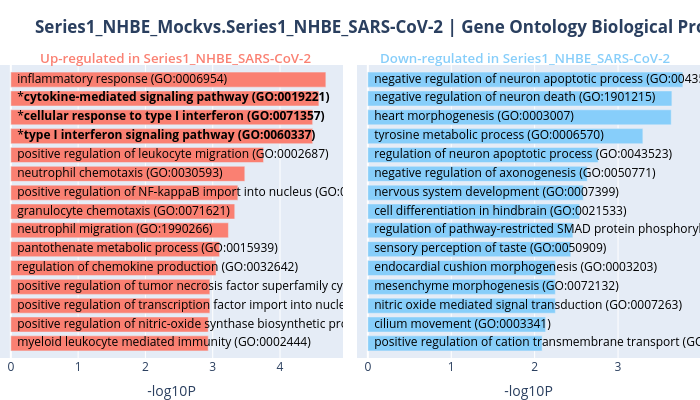

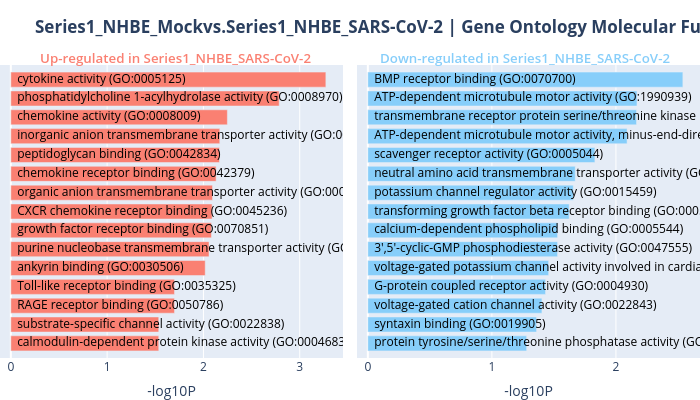

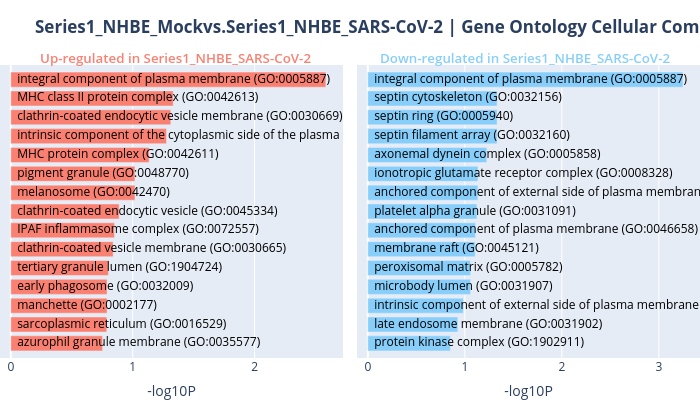

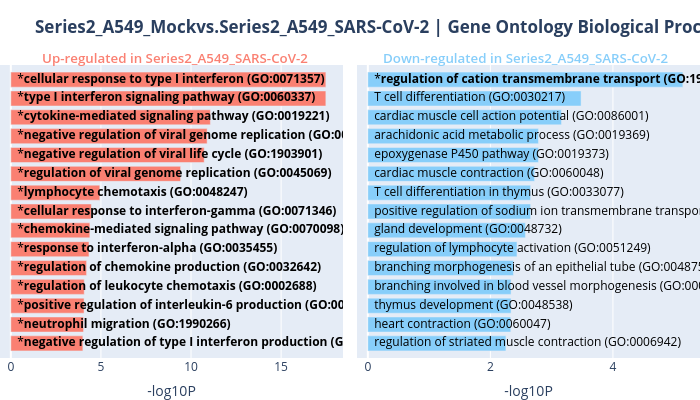

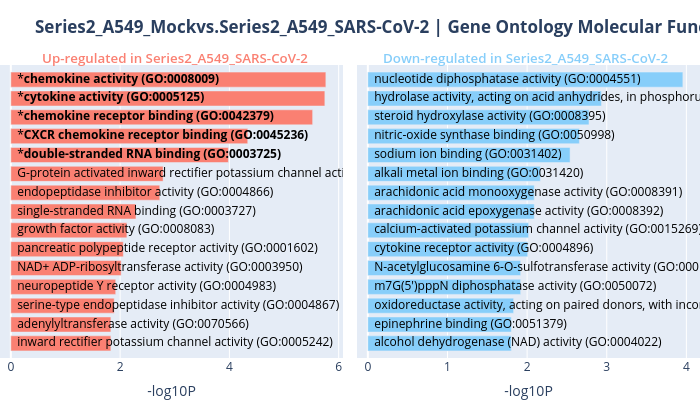

...

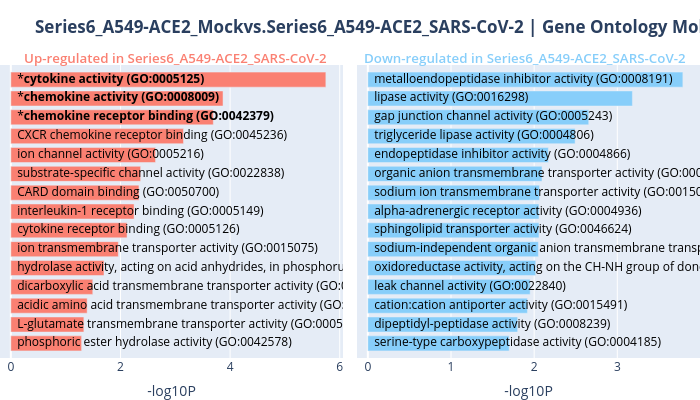

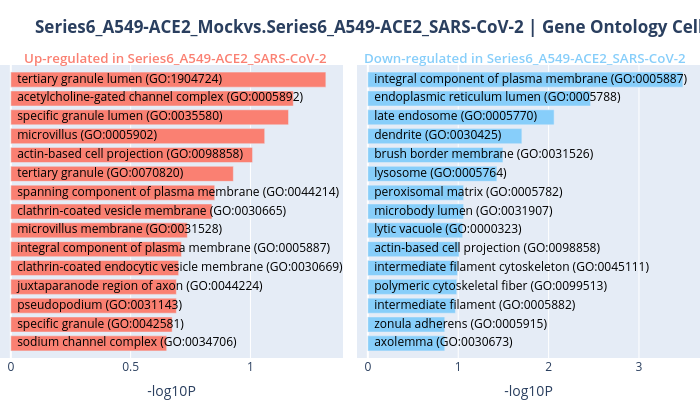

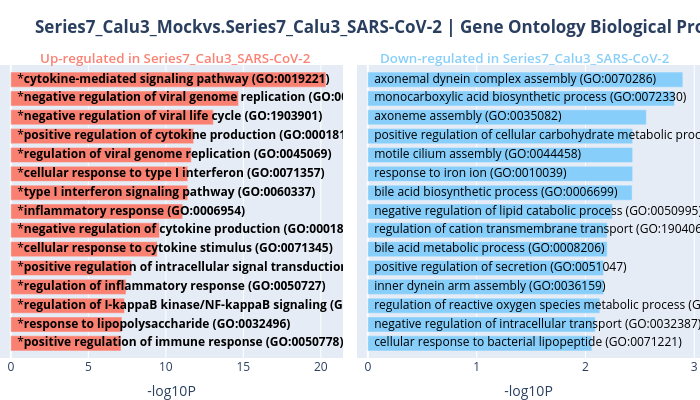

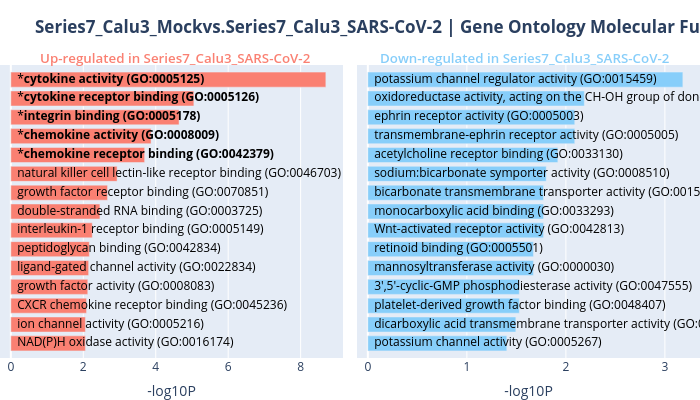

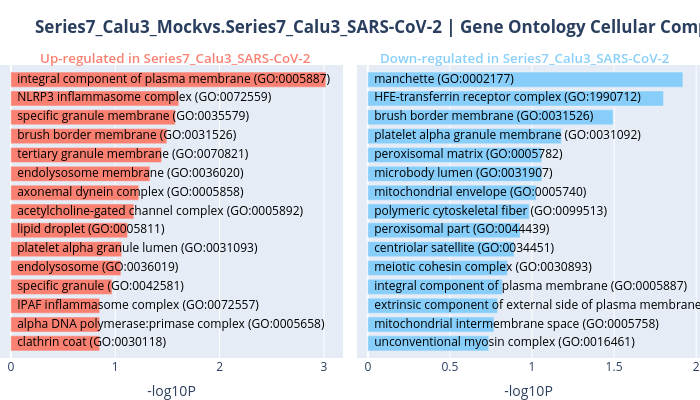

In [23]:
for label, signature in signatures.items():
    # Create dataframe
    enrichment_results = results['go_enrichment'][label]
    enrichment_dataframe = pd.concat([enrichment_results['upregulated'], enrichment_results['downregulated']])

    # Plot barcharts
    libraries = enrichment_dataframe['gene_set_library'].unique()   
    for gene_set_library in libraries:
        plot_library_barchart(enrichment_results, gene_set_library, enrichment_results['signature_label'], enrichment_results['sort_results_by']) # 10 300
    

# Pathway enrichment

In [24]:
def run_pathway(enrichr_results, signature_label, plot_type='interactive', sort_results_by='pvalue'):

    # Libraries
    libraries = {
        'KEGG_2016': 'KEGG Pathways',
        'WikiPathways_2016': 'WikiPathways',
        'Reactome_2016': 'Reactome Pathways'
    }

    # Get Enrichment Results
    enrichment_results = {geneset: get_enrichr_results(enrichr_results[geneset]['userListId'], gene_set_libraries=libraries, geneset=geneset) for geneset in ['upregulated', 'downregulated']}
    enrichment_results['signature_label'] = signature_label
    enrichment_results['plot_type'] = plot_type
    enrichment_results['sort_results_by'] = sort_results_by

    # Return
    return enrichment_results

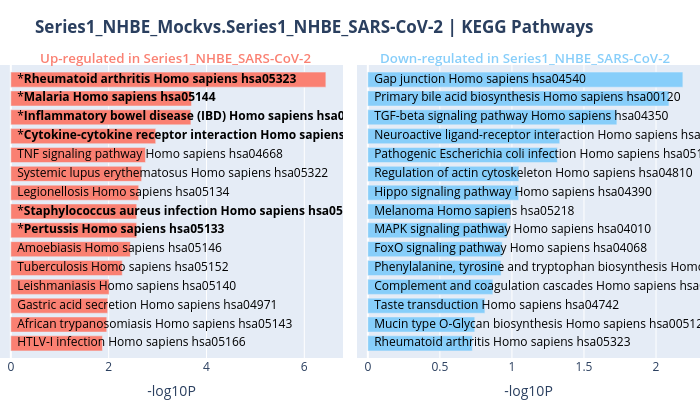

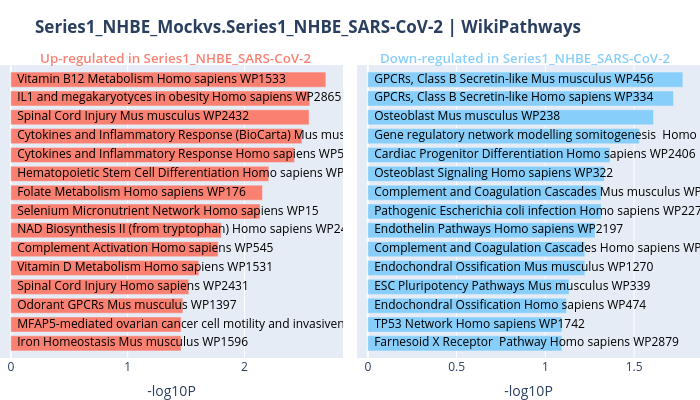

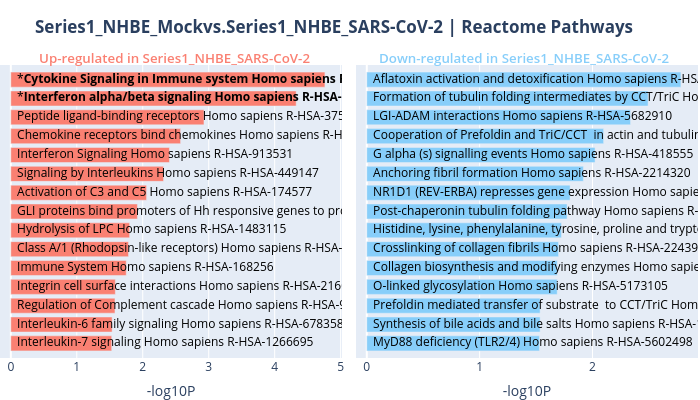

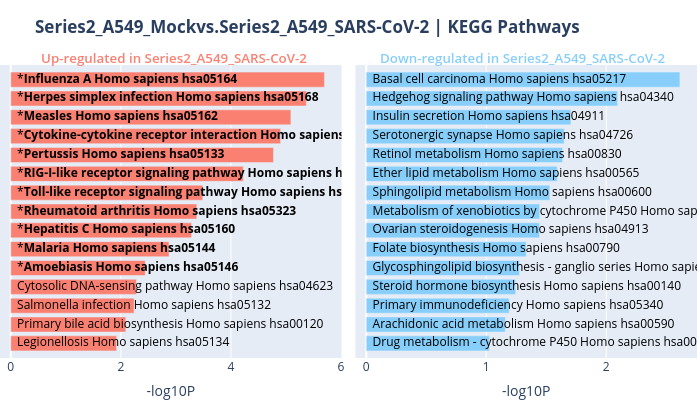

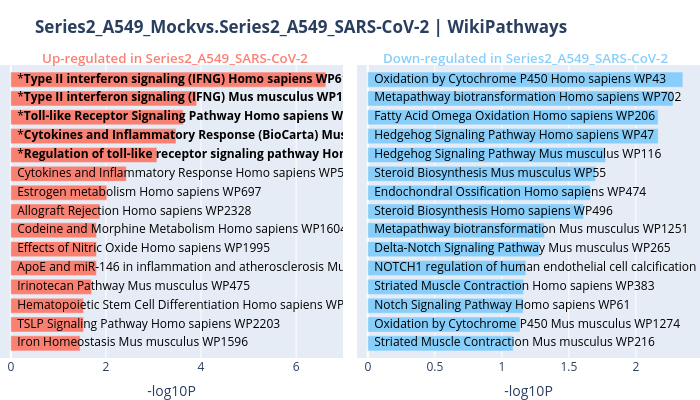

...

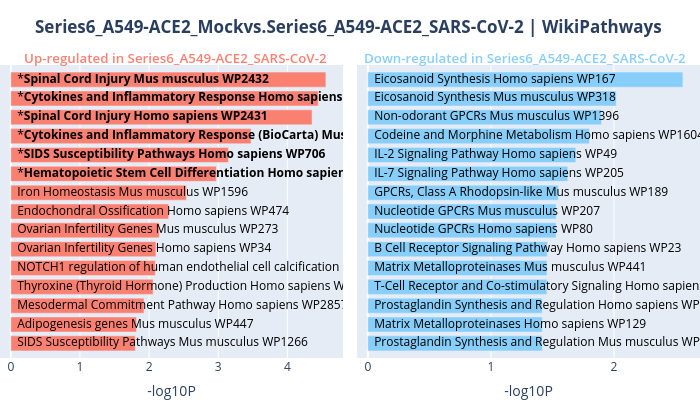

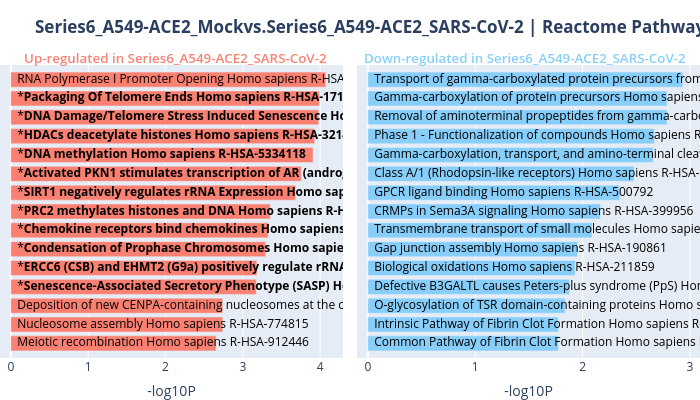

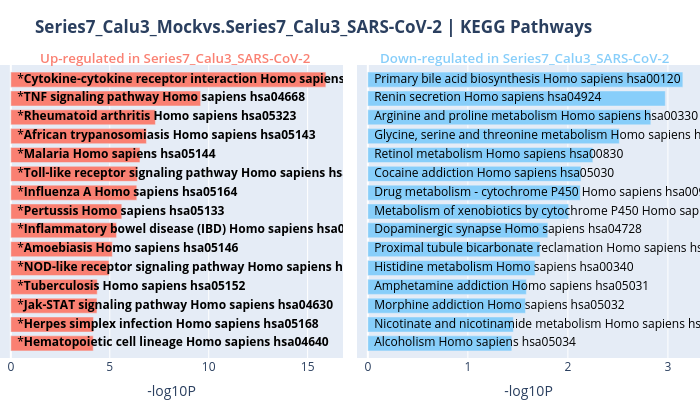

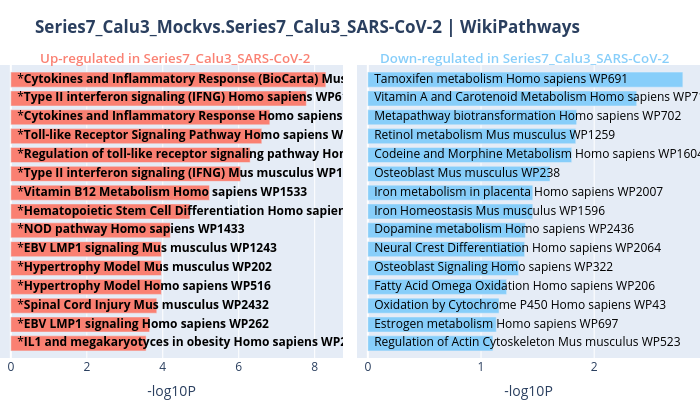

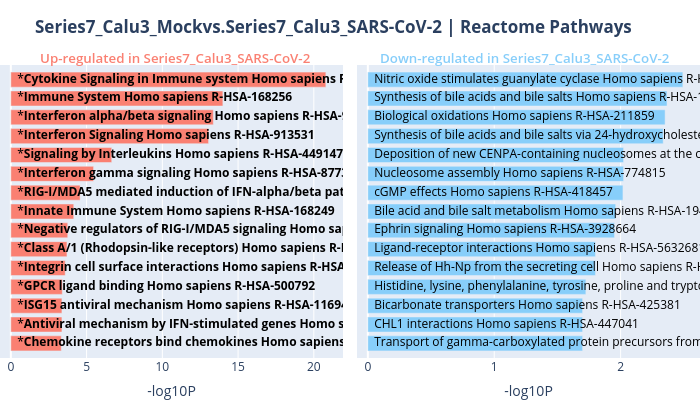

In [25]:
# Initialize results
results['pathway_enrichment'] = {}

# Loop through results
for label, enrichr_results in results['enrichr'].items():
    # Run analysis
    results['pathway_enrichment'][label] = run_pathway(enrichr_results=enrichr_results, signature_label=label, plot_type=plot_type, sort_results_by='pvalue')

for label, signature in signatures.items():
    # Create dataframe
    enrichment_results = results['pathway_enrichment'][label]
    enrichment_dataframe = pd.concat([enrichment_results['upregulated'], enrichment_results['downregulated']])

    # Plot barcharts
    libraries = enrichment_dataframe['gene_set_library'].unique()   
    for gene_set_library in libraries:
        # Display results
        plot_library_barchart(enrichment_results, gene_set_library, enrichment_results['signature_label'], enrichment_results['sort_results_by'])


# Transcription factor enrichment

In [26]:
def run_tf(enrichr_results, signature_label):
    
    # Libraries
    libraries = {
        'ChEA_2016': '### A. ChEA (experimentally validated targets)',
        'ENCODE_TF_ChIP-seq_2015': '### B. ENCODE (experimentally validated targets)',
        'ARCHS4_TFs_Coexp': '### C. ARCHS4 (coexpressed genes)'
    }

    # Initialize results
    results = []

    # Loop through genesets
    for geneset in ['upregulated', 'downregulated']:

        # Append ChEA results
        enrichment_dataframe = get_enrichr_results(enrichr_results[geneset]['userListId'], gene_set_libraries=libraries, geneset=geneset)
        results.append(enrichment_dataframe)

    # Concatenate results
    enrichment_dataframe = pd.concat(results)

    return {'enrichment_dataframe': enrichment_dataframe, 'signature_label': signature_label}

def results_table(enrichment_dataframe, source_label, target_label):

    # Get libraries
    for gene_set_library in enrichment_dataframe['gene_set_library'].unique():

        # Get subset
        enrichment_dataframe_subset = enrichment_dataframe[enrichment_dataframe['gene_set_library'] == gene_set_library].copy()

        # Get unique values from source column
        enrichment_dataframe_subset[source_label] = [x.split('_')[0] for x in enrichment_dataframe_subset['term_name']]
        enrichment_dataframe_subset = enrichment_dataframe_subset.sort_values(['FDR', 'pvalue']).rename(columns={'pvalue': 'P-value'}).drop_duplicates(source_label)

        # Add links and bold for significant results
        enrichment_dataframe_subset[source_label] = ['<a href="http://www.mirbase.org/cgi-bin/query.pl?terms={x}" target="_blank">{x}</a>'.format(**locals()) if '-miR-' in x else '<a href="http://amp.pharm.mssm.edu/Harmonizome/gene/{x}" target="_blank">{x}</a>'.format(**locals())for x in enrichment_dataframe_subset[source_label]]
        enrichment_dataframe_subset[source_label] = [rowData[source_label].replace('target="_blank">', 'target="_blank"><b>').replace('</a>', '*</b></a>') if rowData['FDR'] < 0.05 else rowData[source_label] for index, rowData in enrichment_dataframe_subset.iterrows()]

        # Add rank
        enrichment_dataframe_subset['Rank'] = ['<b>'+str(x+1)+'</b>' for x in range(len(enrichment_dataframe_subset.index))]

        # Add overlapping genes with tooltip
        enrichment_dataframe_subset['nr_overlapping_genes'] = [len(x) for x in enrichment_dataframe_subset['overlapping_genes']]
        enrichment_dataframe_subset['overlapping_genes'] = [', '.join(x) for x in enrichment_dataframe_subset['overlapping_genes']]
        enrichment_dataframe_subset[target_label.title()] = ['{nr_overlapping_genes} {geneset} '.format(**rowData)+target_label+'s' for index, rowData in enrichment_dataframe_subset.iterrows()]
        # enrichment_dataframe[target_label.title()] = ['<span class="gene-tooltip">{nr_overlapping_genes} {geneset} '.format(**rowData)+target_label+'s<div class="gene-tooltip-text">{overlapping_genes}</div></span>'.format(**rowData) for index, rowData in enrichment_dataframe.iterrows()]

        # Convert to HTML
        pd.set_option('max.colwidth', -1)
        html_table = enrichment_dataframe_subset.head(50)[['Rank', source_label, 'P-value', 'FDR', target_label.title()]].to_html(escape=False, index=False, classes='w-100')
        html_results = '<div style="max-height: 200px; overflow-y: scroll;">{}</div>'.format(html_table)

        # Add CSS
        display(HTML('<style>.w-100{width: 100%;} .text-left th{text-align: left !important;}</style>'))
        display(HTML('<style>.slick-cell{overflow: visible;}.gene-tooltip{text-decoration: underline; text-decoration-style: dotted;}.gene-tooltip .gene-tooltip-text{visibility: hidden; position: absolute; left: 60%; width: 250px; z-index: 1000; text-align: center; background-color: black; color: white; padding: 5px 10px; border-radius: 5px;} .gene-tooltip:hover .gene-tooltip-text{visibility: visible;} .gene-tooltip .gene-tooltip-text::after {content: " ";position: absolute;bottom: 100%;left: 50%;margin-left: -5px;border-width: 5px;border-style: solid;border-color: transparent transparent black transparent;}</style>'))

        # Display gene set
        display(Markdown(gene_set_library))

        # Display table
        display(HTML(html_results))

        # Download enrichment results from enrichment_dataframe
        # download_button(enrichment_results.to_csv(sep='\t'), 'Download Enrichment Results', 'enrichment.txt')
        
def display_table(tf_analysis_results):
    
    # Plot Table
    results_table(tf_analysis_results['enrichment_dataframe'].copy(), source_label='Transcription Factor', target_label='target')

    # Download button
    results_dataframe = tf_analysis_results['enrichment_dataframe'].copy()
    results_dataframe['gene_set_library'] = [x.split('. ')[-1] for x in results_dataframe['gene_set_library']]

In [27]:
# Initialize results
results['tf_enrichment'] = {}

# Loop through results
for label, enrichr_results in results['enrichr'].items():
    display(Markdown("## "+label))
    # Run analysis
    results['tf_enrichment'][label] = run_tf(enrichr_results=enrichr_results, signature_label=label)
    display_table(results['tf_enrichment'][label])

## Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2

### A. ChEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,EZH2 27304074 Chip-Seq ESCs Mouse*,0.000026,0.008492,43 downregulated targets
2,SUZ12 27294783 Chip-Seq ESCs Mouse*,0.000016,0.010016,80 downregulated targets
3,JARID2 20064375 ChIP-Seq MESCs Mouse*,0.000096,0.020662,49 downregulated targets
4,EZH2 27294783 Chip-Seq ESCs Mouse*,0.000234,0.037683,75 downregulated targets
5,RNF2 27304074 Chip-Seq ESCs Mouse*,0.000350,0.045198,58 downregulated targets
6,MTF2 20144788 ChIP-Seq MESCs Mouse,0.000483,0.051970,102 downregulated targets
7,SUZ12 18692474 ChIP-Seq MEFs Mouse,0.000878,0.070825,46 downregulated targets
8,JARID2 20075857 ChIP-Seq MESCs Mouse,0.000808,0.074490,50 downregulated targets
9,SUZ12 18692474 ChIP-Seq MESCs Mouse,0.001808,0.129572,68 downregulated targets
10,SUZ12 20075857 ChIP-Seq MESCs Mouse,0.002163,0.139512,136 downregulated targets


### B. ENCODE (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,EZH2 B cell hg19*,0.000028,0.022450,79 downregulated targets
2,EZH2 keratinocyte hg19,0.000992,0.404711,72 upregulated targets
3,STAT2 K562 hg19,0.000504,0.410937,17 upregulated targets
4,RELA GM12878 hg19,0.002636,0.716858,33 upregulated targets
5,EZH2 skeletal muscle myoblast hg19,0.003663,0.747330,69 upregulated targets
6,NELFE K562 hg19,0.010290,1.000000,16 upregulated targets
7,EZH2 fibroblast of lung hg19,0.011743,1.000000,66 upregulated targets
8,RELA GM18526 hg19,0.011913,1.000000,32 upregulated targets
9,EZH2 fibroblast of dermis hg19,0.023575,1.000000,64 downregulated targets
10,STAT1 K562 hg19,0.027638,1.000000,15 upregulated targets


### C. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,SLC4A10 human tf ARCHS4 coexpression*,5.748745e-07,0.000496,24 downregulated targets
2,ARNT2 human tf ARCHS4 coexpression*,5.748745e-07,0.000991,24 downregulated targets
3,ZNF365 human tf ARCHS4 coexpression*,2.049435e-06,0.001178,23 downregulated targets
4,RAPGEF4 human tf ARCHS4 coexpression*,2.261235e-05,0.009746,21 downregulated targets
5,RGS7 human tf ARCHS4 coexpression*,6.975123e-05,0.017179,20 downregulated targets
6,ZBP1 human tf ARCHS4 coexpression*,2.261235e-05,0.019492,21 upregulated targets
7,ZSCAN18 human tf ARCHS4 coexpression*,6.975123e-05,0.020042,20 downregulated targets
8,HLF human tf ARCHS4 coexpression*,6.975123e-05,0.024050,20 downregulated targets
9,RORB human tf ARCHS4 coexpression*,2.043020e-04,0.035222,19 downregulated targets
10,ETV3L human tf ARCHS4 coexpression*,2.261235e-05,0.038984,21 upregulated targets


## Series2_A549_Mockvs.Series2_A549_SARS-CoV-2

### A. ChEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,IRF1 21803131 ChIP-Seq MONOCYTES Human*,1.885705e-07,0.000122,27 upregulated targets
2,EZH2 27294783 Chip-Seq ESCs Mouse,3.842118e-04,0.082606,74 downregulated targets
3,JARID2 20064375 ChIP-Seq MESCs Mouse,3.442237e-04,0.111012,47 downregulated targets
4,JARID2 20075857 ChIP-Seq MESCs Mouse,2.546940e-04,0.164278,52 downregulated targets
5,EZH2 27304074 Chip-Seq ESCs Mouse,1.634375e-03,0.263543,37 downregulated targets
6,RNF2 27304074 Chip-Seq ESCs Mouse,2.754313e-03,0.355306,54 downregulated targets
7,CTNNB1 24651522 ChIP-Seq LGR5+ INTESTINAL STEM Human,7.697006e-03,0.551619,10 downregulated targets
8,SUZ12 18692474 ChIP-Seq MEFs Mouse,7.303227e-03,0.588823,42 downregulated targets
9,SUZ12 27294783 Chip-Seq ESCs Mouse,5.487773e-03,0.589936,68 downregulated targets
10,SUZ12 18692474 ChIP-Seq MESCs Mouse,6.404448e-03,0.590124,65 downregulated targets


### B. ENCODE (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,STAT2 K562 hg19*,3.487783e-24,2.846031e-21,45 upregulated targets
2,STAT1 K562 hg19*,3.140538e-18,1.281340e-15,43 upregulated targets
3,SMARCC2 HeLa-S3 hg19,9.999958e-01,9.999958e-01,2 upregulated targets
4,TCF12 MCF-7 hg19,4.575410e-03,1.000000e+00,8 downregulated targets
5,EZH2 fibroblast of lung hg19,8.091708e-03,1.000000e+00,67 upregulated targets
6,RELA GM12878 hg19,8.462635e-03,1.000000e+00,31 upregulated targets
7,SUZ12 NT2-D1 hg19,1.506518e-02,1.000000e+00,23 downregulated targets
8,NELFE K562 hg19,2.148803e-02,1.000000e+00,15 upregulated targets
9,EP300 MCF-7 hg19,3.219282e-02,1.000000e+00,9 downregulated targets
10,EZH2 mammary epithelial cell hg19,3.260869e-02,1.000000e+00,63 upregulated targets


### C. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,STAT2 human tf ARCHS4 coexpression*,6.389631e-27,1.101572e-23,50 upregulated targets
2,STAT1 human tf ARCHS4 coexpression*,5.473974e-26,4.718566e-23,49 upregulated targets
3,PARP12 human tf ARCHS4 coexpression*,3.711097e-24,1.279586e-21,47 upregulated targets
4,ZNFX1 human tf ARCHS4 coexpression*,3.711097e-24,1.599483e-21,47 upregulated targets
5,ETV7 human tf ARCHS4 coexpression*,3.711097e-24,2.132644e-21,47 upregulated targets
6,IRF7 human tf ARCHS4 coexpression*,5.948884e-19,1.709313e-16,41 upregulated targets
7,TRAFD1 human tf ARCHS4 coexpression*,3.960065e-18,9.753075e-16,40 upregulated targets
8,BATF2 human tf ARCHS4 coexpression*,1.600528e-16,3.449138e-14,38 upregulated targets
9,SP100 human tf ARCHS4 coexpression*,9.705983e-16,1.859235e-13,37 upregulated targets
10,IFI16 human tf ARCHS4 coexpression*,1.778080e-13,3.065411e-11,34 upregulated targets


## Series5_A549_Mockvs.Series5_A549_SARS-CoV-2

### A. ChEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,BACH1 22875853 ChIP-PCR HELA AND SCP4 Human,0.000772,0.498021,53 upregulated targets
2,LXR 22292898 ChIP-Seq THP-1 Human,0.001557,1.000000,71 downregulated targets
3,ERG 21242973 ChIP-ChIP JURKAT Human,0.003121,1.000000,17 downregulated targets
4,SUZ12 18974828 ChIP-Seq MESCs Mouse,0.003807,1.000000,67 upregulated targets
5,RELA 24523406 ChIP-Seq FIBROSARCOMA Human,0.005503,1.000000,44 upregulated targets
6,SUZ12 18555785 ChIP-Seq MESCs Mouse,0.006203,1.000000,40 upregulated targets
7,SUZ12 18692474 ChIP-Seq MEFs Mouse,0.011688,1.000000,41 upregulated targets
8,SMAD 19615063 ChIP-ChIP OVARY Human,0.012743,1.000000,8 upregulated targets
9,JARID2 20075857 ChIP-Seq MESCs Mouse,0.015413,1.000000,44 upregulated targets
10,SUZ12 20075857 ChIP-Seq MESCs Mouse,0.017073,1.000000,129 upregulated targets


### B. ENCODE (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,EZH2 B cell hg19*,7.154318e-07,0.000584,85 upregulated targets
2,NELFE K562 hg19*,4.037600e-06,0.003295,24 downregulated targets
3,EP300 HeLa-S3 hg19,1.405912e-04,0.057361,69 upregulated targets
4,ESR1 ECC-1 hg19,1.579040e-04,0.064425,32 downregulated targets
5,POLR2AphosphoS2 A549 hg19,3.842118e-04,0.104506,74 downregulated targets
6,FOXM1 MCF-7 hg19,1.089802e-03,0.222320,12 downregulated targets
7,BCL3 GM12878 hg19,4.201575e-03,0.685697,23 downregulated targets
8,NR3C1 ECC-1 hg19,6.889549e-03,0.936979,13 downregulated targets
9,EZH2 skeletal muscle myoblast hg19,5.487773e-03,1.000000,68 upregulated targets
10,RAD21 HCT116 hg19,8.834602e-03,1.000000,66 downregulated targets


### C. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,HNF4A human tf ARCHS4 coexpression*,2.556990e-17,4.408251e-14,39 downregulated targets
2,NR1H4 human tf ARCHS4 coexpression*,1.600528e-16,1.379655e-13,38 downregulated targets
3,FOXA3 human tf ARCHS4 coexpression*,9.705983e-16,5.577705e-13,37 downregulated targets
4,CREB3L3 human tf ARCHS4 coexpression*,3.237322e-14,1.395286e-11,35 downregulated targets
5,HNF4G human tf ARCHS4 coexpression*,9.435118e-13,2.711024e-10,33 downregulated targets
6,NR1I2 human tf ARCHS4 coexpression*,9.435118e-13,3.253229e-10,33 downregulated targets
7,ISX human tf ARCHS4 coexpression*,4.833116e-12,8.332292e-10,32 downregulated targets
8,CDX2 human tf ARCHS4 coexpression*,4.833116e-12,9.258103e-10,32 downregulated targets
9,CDX1 human tf ARCHS4 coexpression*,4.833116e-12,1.041537e-09,32 downregulated targets
10,MLXIPL human tf ARCHS4 coexpression*,4.833116e-12,1.190327e-09,32 downregulated targets


## Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2

### A. ChEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,EZH2 27294783 Chip-Seq ESCs Mouse,0.000384,0.082606,74 upregulated targets
2,SUZ12 18692474 ChIP-Seq MEFs Mouse,0.000265,0.085561,48 upregulated targets
3,SUZ12 27294783 Chip-Seq ESCs Mouse,0.000140,0.090301,76 upregulated targets
4,SUZ12 20075857 ChIP-Seq MESCs Mouse,0.000538,0.347292,140 downregulated targets
5,JARID2 20075857 ChIP-Seq MESCs Mouse,0.003896,0.628238,47 upregulated targets
6,BACH1 22875853 ChIP-PCR HELA AND SCP4 Human,0.005747,0.741404,49 upregulated targets
7,BP1 19119308 ChIP-ChIP Hs578T Human,0.009582,0.882934,3 upregulated targets
8,RNF2 16625203 ChIP-ChIP MESCs Mouse,0.009287,0.998320,44 upregulated targets
9,CTNNB1 24651522 ChIP-Seq LGR5+ INTESTINAL STEM Human,0.007697,1.000000,10 downregulated targets
10,PBX 27287812 Chip-Seq EMBYONIC-LIMB Mouse,0.011743,1.000000,66 downregulated targets


### B. ENCODE (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,POLR2AphosphoS2 A549 hg19*,0.000001,0.000556,84 upregulated targets
2,NELFE K562 hg19*,0.000001,0.000995,25 upregulated targets
3,EZH2 B cell hg19*,0.000009,0.002349,81 upregulated targets
4,ZNF274 K562 hg19*,0.000115,0.023497,44 upregulated targets
5,MEF2A K562 hg19,0.000409,0.066717,19 upregulated targets
6,SIN3A HCT116 hg19,0.001249,0.145632,31 upregulated targets
7,BCLAF1 K562 hg19,0.001529,0.155960,41 upregulated targets
8,BCL11A GM12878 hg19,0.001231,0.167354,47 upregulated targets
9,BCL11A H1-hESC hg19,0.002701,0.220374,9 upregulated targets
10,TAF7 K562 hg19,0.003082,0.228665,33 upregulated targets


### C. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,FOXA3 human tf ARCHS4 coexpression*,5.211859e-10,8.985245e-07,29 downregulated targets
2,CREB3L3 human tf ARCHS4 coexpression*,9.732964e-09,3.355926e-06,27 downregulated targets
3,NR1I2 human tf ARCHS4 coexpression*,9.732964e-09,4.194908e-06,27 downregulated targets
4,HNF4A human tf ARCHS4 coexpression*,9.732964e-09,5.593210e-06,27 downregulated targets
5,NR1H4 human tf ARCHS4 coexpression*,9.732964e-09,8.389815e-06,27 downregulated targets
6,NR0B2 human tf ARCHS4 coexpression*,3.956326e-08,1.136784e-05,26 downregulated targets
7,MLXIPL human tf ARCHS4 coexpression*,5.748745e-07,1.415834e-04,24 downregulated targets
8,RORC human tf ARCHS4 coexpression*,2.049435e-06,4.416532e-04,23 downregulated targets
9,PCSK6 human tf ARCHS4 coexpression*,2.261235e-05,3.898370e-03,21 downregulated targets
10,KLF15 human tf ARCHS4 coexpression*,2.261235e-05,4.331522e-03,21 downregulated targets


## Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2

### A. ChEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,RELA 24523406 ChIP-Seq FIBROSARCOMA Human*,1.442512e-11,4.652100e-09,70 upregulated targets
2,IRF1 21803131 ChIP-Seq MONOCYTES Human*,1.043155e-11,6.728348e-09,34 upregulated targets
3,BACH1 22875853 ChIP-PCR HELA AND SCP4 Human*,2.845901e-07,6.118686e-05,65 upregulated targets
4,SUZ12 20075857 ChIP-Seq MESCs Mouse*,3.341466e-06,2.155246e-03,152 downregulated targets
5,SUZ12 18692474 ChIP-Seq MEFs Mouse*,1.856101e-05,2.992962e-03,52 upregulated targets
6,SUZ12 18692474 ChIP-Seq MESCs Mouse*,2.673867e-04,3.449288e-02,72 upregulated targets
7,IRF8 22096565 ChIP-ChIP GC-B Human,6.142441e-04,5.659820e-02,14 upregulated targets
8,IRF8 22096565 ChIP-ChIP GC-B Mouse,5.400815e-04,5.805877e-02,35 upregulated targets
9,JARID2 20064375 ChIP-Seq MESCs Mouse,1.839268e-04,5.931638e-02,48 downregulated targets
10,EZH2 27294783 Chip-Seq ESCs Mouse,6.221066e-04,1.003147e-01,73 downregulated targets


### B. ENCODE (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,STAT2 K562 hg19*,2.933807e-23,2.393987e-20,44 upregulated targets
2,STAT1 K562 hg19*,1.795025e-14,7.323703e-12,38 upregulated targets
3,IKZF1 GM12878 hg19*,1.073250e-10,2.919240e-08,97 upregulated targets
4,RELA GM12878 hg19*,2.141411e-07,4.368479e-05,45 upregulated targets
5,EP300 HeLa-S3 hg19*,1.405912e-04,1.912040e-02,69 upregulated targets
6,EP300 CH12.LX mm9*,1.400021e-04,2.284835e-02,76 upregulated targets
7,BATF GM12878 hg19*,1.976581e-04,2.304128e-02,36 upregulated targets
8,EZH2 B cell hg19,1.400021e-04,1.142417e-01,76 downregulated targets
9,TCF12 SK-N-SH hg19,1.736738e-03,1.771473e-01,36 upregulated targets
10,CBX8 K562 hg19,3.663383e-03,3.321467e-01,69 upregulated targets


### C. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,ETV7 human tf ARCHS4 coexpression*,5.056246e-40,8.716968e-37,63 upregulated targets
2,ZNFX1 human tf ARCHS4 coexpression*,7.602891e-37,6.553692e-34,60 upregulated targets
3,STAT2 human tf ARCHS4 coexpression*,8.322044e-36,4.782401e-33,59 upregulated targets
4,PARP12 human tf ARCHS4 coexpression*,8.900276e-35,3.068815e-32,58 upregulated targets
5,BATF2 human tf ARCHS4 coexpression*,8.900276e-35,3.836019e-32,58 upregulated targets
6,IRF7 human tf ARCHS4 coexpression*,9.297925e-34,2.671604e-31,57 upregulated targets
7,STAT1 human tf ARCHS4 coexpression*,9.485507e-33,2.336145e-30,56 upregulated targets
8,NR4A3 human tf ARCHS4 coexpression*,7.267421e-28,1.566129e-25,51 upregulated targets
9,TRAFD1 human tf ARCHS4 coexpression*,6.389631e-27,1.223969e-24,50 upregulated targets
10,SP100 human tf ARCHS4 coexpression*,2.934491e-23,5.059063e-21,46 upregulated targets


# Kinase Enrichment Analysis

In [28]:
def run_ke(enrichr_results, signature_label):
    # Libraries
    libraries = {
        'KEA_2015': '### A. KEA (experimentally validated targets)',
        'ARCHS4_Kinases_Coexp': '### B. ARCHS4 (coexpressed genes)'
    }

    # Initialize results
    results = []

    # Loop through genesets
    for geneset in ['upregulated', 'downregulated']:

        # Append ChEA results
        enrichment_dataframe = get_enrichr_results(enrichr_results[geneset]['userListId'], gene_set_libraries=libraries, geneset=geneset)
        results.append(enrichment_dataframe)

    # Concatenate results
    enrichment_dataframe = pd.concat(results)

    return {'enrichment_dataframe': enrichment_dataframe, 'signature_label': signature_label}


In [29]:
# Initialize results
results['kinase_enrichment'] = {}

# Loop through results
for label, enrichr_results in results['enrichr'].items():
    display(Markdown("## "+label))
    # Run analysis
    results['kinase_enrichment'][label] = run_ke(enrichr_results=enrichr_results, signature_label=label)

    # Display results
    display_table(results['kinase_enrichment'][label])

## Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2

### A. KEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,GUCY2C,0.025000,1.0,1 upregulated targets
2,PDIK1L,0.025000,1.0,1 upregulated targets
3,ROR2,0.025000,1.0,1 upregulated targets
4,DCLK1,0.025000,1.0,1 downregulated targets
5,PRKCH,0.034879,1.0,2 upregulated targets
6,MUSK,0.049376,1.0,1 upregulated targets
7,OBSCN,0.049376,1.0,1 upregulated targets
8,EPHA4,0.049376,1.0,1 downregulated targets
9,TTN,0.049376,1.0,1 downregulated targets
10,CAMKK2,0.073144,1.0,1 upregulated targets


### B. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,PRKCG human kinase ARCHS4 coexpression*,3.956326e-08,0.000020,26 downregulated targets
2,PRKACB human kinase ARCHS4 coexpression*,5.748745e-07,0.000143,24 downregulated targets
3,PLK5 human kinase ARCHS4 coexpression*,2.049435e-06,0.000170,23 downregulated targets
4,NLK human kinase ARCHS4 coexpression*,2.049435e-06,0.000204,23 downregulated targets
5,CAMK4 human kinase ARCHS4 coexpression*,2.049435e-06,0.000255,23 downregulated targets
6,BRSK2 human kinase ARCHS4 coexpression*,2.049435e-06,0.000340,23 downregulated targets
7,TTBK1 human kinase ARCHS4 coexpression*,6.973603e-06,0.000347,22 downregulated targets
8,CAMKV human kinase ARCHS4 coexpression*,6.973603e-06,0.000386,22 downregulated targets
9,CAMK2B human kinase ARCHS4 coexpression*,6.973603e-06,0.000434,22 downregulated targets
10,CAMK1D human kinase ARCHS4 coexpression*,6.973603e-06,0.000496,22 downregulated targets


## Series2_A549_Mockvs.Series2_A549_SARS-CoV-2

### A. KEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,SYK,0.015906,1.0,4 downregulated targets
2,DCLK1,0.025000,1.0,1 upregulated targets
3,TNNI3K,0.025000,1.0,1 upregulated targets
4,GUCY2C,0.025000,1.0,1 downregulated targets
5,LTK,0.025000,1.0,1 downregulated targets
6,EPHB3,0.025000,1.0,1 downregulated targets
7,PRKCD,0.046356,1.0,6 downregulated targets
8,MUSK,0.049376,1.0,1 downregulated targets
9,WNK3,0.049376,1.0,1 downregulated targets
10,TESK2,0.049376,1.0,1 downregulated targets


### B. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,EIF2AK2 human kinase ARCHS4 coexpression*,1.688661e-21,8.409532e-19,44 upregulated targets
2,JAK2 human kinase ARCHS4 coexpression*,9.732964e-09,2.423508e-06,27 upregulated targets
3,RIPK1 human kinase ARCHS4 coexpression*,3.956326e-08,6.567502e-06,26 upregulated targets
4,MLKL human kinase ARCHS4 coexpression*,6.975123e-05,8.684028e-03,20 upregulated targets
5,IRAK4 human kinase ARCHS4 coexpression*,5.670820e-04,4.706780e-02,18 upregulated targets
6,NEK11 human kinase ARCHS4 coexpression,5.670820e-04,5.648136e-02,18 upregulated targets
7,STK4 human kinase ARCHS4 coexpression,1.488493e-03,9.265867e-02,17 upregulated targets
8,GRK1 human kinase ARCHS4 coexpression,2.043020e-04,1.017424e-01,19 downregulated targets
9,HIPK3 human kinase ARCHS4 coexpression,1.488493e-03,1.058956e-01,17 upregulated targets
10,NEK10 human kinase ARCHS4 coexpression,5.670820e-04,1.412034e-01,18 downregulated targets


## Series5_A549_Mockvs.Series5_A549_SARS-CoV-2

### A. KEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,MAP2K6,0.012052,1.0,2 downregulated targets
2,RPS6KA5,0.023748,1.0,3 downregulated targets
3,ROS1,0.025000,1.0,1 upregulated targets
4,HIPK3,0.025000,1.0,1 upregulated targets
5,GUCY2C,0.025000,1.0,1 downregulated targets
6,EPHB6,0.025000,1.0,1 downregulated targets
7,ACVR2A,0.025000,1.0,1 downregulated targets
8,EPHB3,0.025000,1.0,1 downregulated targets
9,PRKCH,0.034879,1.0,2 downregulated targets
10,PKN1,0.040550,1.0,2 upregulated targets


### B. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,SGK2 human kinase ARCHS4 coexpression*,1.136974e-10,5.662129e-08,30 downregulated targets
2,ERN2 human kinase ARCHS4 coexpression*,2.297804e-09,3.814355e-07,28 downregulated targets
3,ERBB3 human kinase ARCHS4 coexpression*,2.297804e-09,5.721532e-07,28 downregulated targets
4,FGFR4 human kinase ARCHS4 coexpression*,1.541429e-07,1.919080e-05,25 downregulated targets
5,TRPM6 human kinase ARCHS4 coexpression*,5.748745e-07,5.725750e-05,24 downregulated targets
6,IRAK2 human kinase ARCHS4 coexpression*,1.541429e-07,7.676318e-05,25 upregulated targets
7,PTK6 human kinase ARCHS4 coexpression*,6.973603e-06,5.788091e-04,22 downregulated targets
8,STYK1 human kinase ARCHS4 coexpression*,2.261235e-05,1.251217e-03,21 downregulated targets
9,NEK10 human kinase ARCHS4 coexpression*,2.261235e-05,1.407619e-03,21 downregulated targets
10,MAPK15 human kinase ARCHS4 coexpression*,2.261235e-05,1.608707e-03,21 downregulated targets


## Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2

### A. KEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,FES,0.008752,1.0,2 downregulated targets
2,PDIK1L,0.025000,1.0,1 upregulated targets
3,ACVR2A,0.025000,1.0,1 upregulated targets
4,ROR2,0.025000,1.0,1 upregulated targets
5,MYLK4,0.025000,1.0,1 downregulated targets
6,MYLK3,0.025000,1.0,1 downregulated targets
7,CIT,0.025000,1.0,1 downregulated targets
8,DCLK1,0.025000,1.0,1 downregulated targets
9,TTBK1,0.025000,1.0,1 downregulated targets
10,PKN1,0.040550,1.0,2 downregulated targets


### B. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,SGK2 human kinase ARCHS4 coexpression*,9.732964e-09,0.000005,27 downregulated targets
2,ERBB3 human kinase ARCHS4 coexpression*,6.975123e-05,0.017368,20 downregulated targets
3,PDK4 human kinase ARCHS4 coexpression,5.670820e-04,0.056481,18 downregulated targets
4,TRPM6 human kinase ARCHS4 coexpression,5.670820e-04,0.070602,18 downregulated targets
5,PTK6 human kinase ARCHS4 coexpression,1.488493e-03,0.074127,17 downregulated targets
6,FGFR4 human kinase ARCHS4 coexpression,1.488493e-03,0.082363,17 downregulated targets
7,PAK5 human kinase ARCHS4 coexpression,1.488493e-03,0.092659,17 downregulated targets
8,ERN2 human kinase ARCHS4 coexpression,5.670820e-04,0.094136,18 downregulated targets
9,MYLK human kinase ARCHS4 coexpression,1.488493e-03,0.105896,17 downregulated targets
10,ALPK2 human kinase ARCHS4 coexpression,3.686256e-03,0.122384,16 downregulated targets


## Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2

### A. KEA (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,HIPK3,0.025000,1.0,1 upregulated targets
2,PDIK1L,0.025000,1.0,1 upregulated targets
3,TRPM6,0.025000,1.0,1 upregulated targets
4,ACVR2B,0.025000,1.0,1 upregulated targets
5,GUCY2C,0.025000,1.0,1 downregulated targets
6,EPHB6,0.025000,1.0,1 downregulated targets
7,EPHB3,0.025000,1.0,1 downregulated targets
8,PKN1,0.040550,1.0,2 upregulated targets
9,PRKCD,0.046356,1.0,6 upregulated targets
10,NME2,0.049376,1.0,1 downregulated targets


### B. ARCHS4 (coexpressed genes)

Rank,Transcription Factor,P-value,FDR,Target
1,EIF2AK2 human kinase ARCHS4 coexpression*,5.948884e-19,2.962544e-16,41 upregulated targets
2,MAP3K8 human kinase ARCHS4 coexpression*,3.960065e-18,9.860562e-16,40 upregulated targets
3,JAK2 human kinase ARCHS4 coexpression*,1.600528e-16,2.656877e-14,38 upregulated targets
4,RIPK2 human kinase ARCHS4 coexpression*,9.705983e-16,9.667159e-14,37 upregulated targets
5,RIPK1 human kinase ARCHS4 coexpression*,9.705983e-16,1.208395e-13,37 upregulated targets
6,IRAK2 human kinase ARCHS4 coexpression*,9.435118e-13,7.831148e-11,33 upregulated targets
7,MLKL human kinase ARCHS4 coexpression*,4.833116e-12,3.438417e-10,32 upregulated targets
8,NEK11 human kinase ARCHS4 coexpression*,2.387946e-11,1.189197e-08,31 downregulated targets
9,PLK3 human kinase ARCHS4 coexpression*,5.211859e-10,2.883895e-08,29 upregulated targets
10,IRAK4 human kinase ARCHS4 coexpression*,5.211859e-10,3.244382e-08,29 upregulated targets


# miRNA Enrichment Analysis

In [30]:
def run_mirna(enrichr_results, signature_label):
    # Libraries
    libraries = {
        'TargetScan_microRNA_2017': '### A. TargetScan (experimentally validated targets)',
        'miRTarBase_2017': '### B. miRTarBase (experimentally validated targets)'
    }

    # Initialize results
    results = []

    # Loop through genesets
    for geneset in ['upregulated', 'downregulated']:

        # Append ChEA results
        enrichment_dataframe = get_enrichr_results(enrichr_results[geneset]['userListId'], gene_set_libraries=libraries, geneset=geneset)
        results.append(enrichment_dataframe)

    # Concatenate results
    enrichment_dataframe = pd.concat(results)

    return {'enrichment_dataframe': enrichment_dataframe, 'signature_label': signature_label}

In [31]:
results['mirna_enrichment'] = {}

# Loop through results
for label, enrichr_results in results['enrichr'].items():
    display(Markdown("## "+label))
    
    # Run analysis
    results['mirna_enrichment'][label] = run_mirna(enrichr_results=enrichr_results, signature_label=label)

    # Display results
    display_table(results['mirna_enrichment'][label])

## Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2

### A. TargetScan (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-3195,0.003569,1.0,16 downregulated targets
2,hsa-miR-2277-5p,0.007347,1.0,18 downregulated targets
3,hsa-miR-937,0.014363,1.0,9 downregulated targets
4,mmu-miR-5122,0.022431,1.0,7 downregulated targets
5,hsa-miR-369-5p,0.024427,1.0,10 downregulated targets
6,mmu-miR-1932,0.033912,1.0,11 upregulated targets
7,mmu-miR-5131,0.039537,1.0,17 downregulated targets
8,hsa-miR-3648,0.040480,1.0,14 downregulated targets
9,mmu-miR-5115,0.041336,1.0,14 downregulated targets
10,hsa-miR-4743,0.043113,1.0,33 upregulated targets


### B. miRTarBase (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-1199-3p,0.000894,1.0,4 downregulated targets
2,mmu-miR-1897-5p,0.003060,1.0,5 downregulated targets
3,hsa-miR-451a,0.007113,1.0,4 upregulated targets
4,hsa-miR-3141,0.008041,1.0,5 downregulated targets
5,hsa-miR-1908-3p,0.008134,1.0,3 downregulated targets
6,mmu-miR-3091-3p,0.008752,1.0,2 downregulated targets
7,hsa-miR-4256,0.010946,1.0,4 upregulated targets
8,mmu-miR-3086-5p,0.012052,1.0,2 downregulated targets
9,hsa-miR-146a-5p,0.012572,1.0,11 upregulated targets
10,mmu-miR-592-5p,0.013279,1.0,4 downregulated targets


## Series2_A549_Mockvs.Series2_A549_SARS-CoV-2

### A. TargetScan (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-4781-5p,0.001701,1.0,35 downregulated targets
2,hsa-miR-4497,0.012350,1.0,26 downregulated targets
3,hsa-miR-4508,0.019466,1.0,39 downregulated targets
4,mmu-miR-341,0.020523,1.0,5 upregulated targets
5,mmu-miR-147,0.033559,1.0,16 downregulated targets
6,hsa-miR-1908,0.057245,1.0,57 downregulated targets
7,hsa-miR-663,0.057245,1.0,57 downregulated targets
8,hsa-miR-1469,0.080751,1.0,6 downregulated targets
9,hsa-miR-4479,0.082039,1.0,13 downregulated targets
10,hsa-miR-1471,0.084131,1.0,11 downregulated targets


### B. miRTarBase (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-146a-5p*,3.601260e-08,0.000117,21 upregulated targets
2,mmu-miR-702-3p,3.684486e-03,1.000000,3 upregulated targets
3,hsa-miR-4787-3p,8.134124e-03,1.000000,3 downregulated targets
4,hsa-miR-892c-5p,1.032720e-02,1.000000,7 upregulated targets
5,mmu-miR-1897-3p,1.205166e-02,1.000000,2 upregulated targets
6,hsa-miR-6814-3p,1.205166e-02,1.000000,2 downregulated targets
7,hsa-miR-7850-5p,1.274893e-02,1.000000,7 upregulated targets
8,hsa-miR-574-5p,1.730699e-02,1.000000,18 upregulated targets
9,hsa-miR-6872-5p,1.998750e-02,1.000000,2 downregulated targets
10,hsa-miR-4698,2.038544e-02,1.000000,11 upregulated targets


## Series5_A549_Mockvs.Series5_A549_SARS-CoV-2

### A. TargetScan (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,mmu-miR-3471*,0.000239,0.040724,57 upregulated targets
2,hsa-miR-4445*,0.000345,0.047092,69 upregulated targets
3,hsa-miR-219-5p,0.000238,0.054088,63 upregulated targets
4,mmu-miR-219-5p,0.000094,0.064480,53 upregulated targets
5,hsa-miR-4782-3p,0.000238,0.081132,63 upregulated targets
6,mmu-miR-196a,0.001417,0.120968,51 upregulated targets
7,mmu-miR-196b,0.001417,0.138249,51 upregulated targets
8,hsa-miR-296-3p,0.001263,0.143789,70 upregulated targets
9,hsa-miR-3610,0.002467,0.187199,16 upregulated targets
10,hsa-miR-4791,0.003596,0.204698,64 upregulated targets


### B. miRTarBase (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-6822-3p,0.000076,0.245249,10 downregulated targets
2,hsa-miR-122-3p,0.000093,0.300525,9 upregulated targets
3,hsa-miR-4766-5p,0.000400,0.648583,11 downregulated targets
4,mmu-miR-466d-5p,0.001031,0.668150,21 upregulated targets
5,hsa-miR-1276,0.000711,0.767673,12 downregulated targets
6,mmu-miR-466k,0.001031,0.835188,21 upregulated targets
7,mmu-miR-466l-5p,0.000907,1.000000,21 upregulated targets
8,mmu-miR-466i-5p,0.001031,1.000000,21 upregulated targets
9,hsa-miR-8057,0.002344,1.000000,11 downregulated targets
10,hsa-miR-146a-3p,0.002548,1.000000,9 downregulated targets


## Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2

### A. TargetScan (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-1278,0.999995,0.999995,12 upregulated targets
2,hsa-miR-4781-5p,0.001701,1.000000,35 downregulated targets
3,hsa-miR-4479,0.005072,1.000000,17 upregulated targets
4,mmu-miR-1843b-3p,0.011932,1.000000,5 upregulated targets
5,mmu-miR-187,0.020126,1.000000,22 downregulated targets
6,hsa-miR-645,0.021308,1.000000,57 downregulated targets
7,mmu-miR-5122,0.022431,1.000000,7 upregulated targets
8,hsa-miR-523,0.022959,1.000000,6 upregulated targets
9,mmu-miR-5105,0.027662,1.000000,7 upregulated targets
10,hsa-miR-3960,0.028600,1.000000,19 upregulated targets


### B. miRTarBase (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-6822-3p,0.000076,0.245249,10 upregulated targets
2,hsa-miR-1276,0.000198,0.321154,13 upregulated targets
3,hsa-miR-1273e,0.001335,1.000000,23 downregulated targets
4,hsa-miR-146a-3p,0.002548,1.000000,9 upregulated targets
5,mmu-miR-296-3p,0.002887,1.000000,3 upregulated targets
6,hsa-miR-6778-3p,0.003908,1.000000,29 downregulated targets
7,hsa-miR-4766-5p,0.005162,1.000000,9 upregulated targets
8,hsa-miR-6764-5p,0.005206,1.000000,13 downregulated targets
9,mmu-miR-224-5p,0.005648,1.000000,3 upregulated targets
10,hsa-miR-1915-3p,0.005794,1.000000,13 downregulated targets


## Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2

### A. TargetScan (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,mmu-miR-493,0.005303,1.0,68 upregulated targets
2,mmu-miR-3086-5p,0.005595,1.0,47 upregulated targets
3,hsa-miR-638,0.007440,1.0,46 upregulated targets
4,hsa-miR-2277-5p,0.015179,1.0,17 downregulated targets
5,mmu-miR-376a,0.021422,1.0,12 upregulated targets
6,mmu-miR-574-3p,0.024165,1.0,17 upregulated targets
7,hsa-miR-1203,0.030536,1.0,26 downregulated targets
8,hsa-miR-4327,0.032609,1.0,63 upregulated targets
9,hsa-miR-3195,0.037663,1.0,13 downregulated targets
10,hsa-miR-4767,0.041572,1.0,28 upregulated targets


### B. miRTarBase (experimentally validated targets)

Rank,Transcription Factor,P-value,FDR,Target
1,hsa-miR-146a-5p*,3.601260e-08,0.000117,21 upregulated targets
2,mmu-miR-296-3p,1.628607e-04,0.263834,4 upregulated targets
3,hsa-miR-3927-5p,2.850598e-04,0.307865,6 upregulated targets
4,mmu-miR-2861,7.919445e-04,0.641475,3 upregulated targets
5,hsa-miR-1237-5p,5.428571e-03,1.000000,8 downregulated targets
6,hsa-miR-3650,5.691846e-03,1.000000,10 upregulated targets
7,hsa-miR-1281,5.730939e-03,1.000000,11 upregulated targets
8,hsa-miR-15b-3p,6.065891e-03,1.000000,6 upregulated targets
9,mmu-miR-1970,6.823799e-03,1.000000,3 upregulated targets
10,hsa-miR-6733-3p,7.009659e-03,1.000000,6 upregulated targets


# L1000CDS2 Query

In [32]:
def run_l1000cds2(signature, nr_genes=500, signature_label='', plot_type='interactive'):
    # Define results
    l1000cds2_results = {'signature_label': signature_label}

    # Define upperGenes Function
    upperGenes = lambda genes: [gene.upper() for gene in genes]

    # Get Data
    data = {"upGenes":upperGenes(signature.index[:nr_genes]),"dnGenes":upperGenes(signature.index[-nr_genes:])}

    # Loop through aggravate:
    for aggravate in [True, False]:

        # Send to API
        config = {"aggravate":aggravate,"searchMethod":"geneSet","share":True,"combination":False,"db-version":"latest"}
        r = requests.post('http://amp.pharm.mssm.edu/L1000CDS2/query',data=json.dumps({"data":data,"config":config}),headers={'content-type':'application/json'})
        label = 'mimic' if aggravate else 'reverse'

        # Add results
        resGeneSet = r.json()
        if resGeneSet.get('topMeta'):
            l1000cds2_dataframe = pd.DataFrame(resGeneSet['topMeta'])[['cell_id', 'pert_desc', 'pert_dose', 'pert_dose_unit', 'pert_id', 'pert_time', 'pert_time_unit', 'pubchem_id', 'score', 'sig_id']].replace('-666', np.nan)
            l1000cds2_results[label] = {'url': 'http://amp.pharm.mssm.edu/L1000CDS2/#/result/{}'.format(resGeneSet['shareId']), 'table': l1000cds2_dataframe}
        else:
            l1000cds2_results[label] = None
    l1000cds2_results['plot_type'] = plot_type

    # Return
    return l1000cds2_results
    
def plot_l1000cds2(l1000cds2_results, nr_drugs=7, height=300):

    # Check if there are results
    if not l1000cds2_results['mimic'] or not l1000cds2_results['reverse']:
        display(Markdown('### No results were found.\n This is likely due to the fact that the gene identifiers were not recognized by L1000CDS<sup>2</sup>. Please note that L1000CDS<sup>2</sup> currently only supports HGNC gene symbols (https://www.genenames.org/). If your dataset uses other gene identifier systems, such as Ensembl IDs or Entrez IDs, consider converting them to HGNC. Automated gene identifier conversion is currently under development.'))
    else:
        # Links
        if l1000cds2_results['signature_label']:
            display(Markdown('\n### {signature_label} signature:'.format(**l1000cds2_results)))
        display(Markdown(' **L1000CDS<sup>2</sup> Links:**'))
        display(Markdown(' *Mimic Signature Query Results*: {url}'.format(**l1000cds2_results['mimic'])))
        display(Markdown(' *Reverse Signature Query Results*: {url}'.format(**l1000cds2_results['reverse'])))

        # Bar charts
        fig = tools.make_subplots(rows=1, cols=2, print_grid=False);
        for i, direction in enumerate(['mimic', 'reverse']):
            drug_counts = l1000cds2_results[direction]['table'].groupby('pert_desc').size().sort_values(ascending=False).iloc[:nr_drugs].iloc[::-1]

            # Get Bar
            bar = go.Bar(
                x=drug_counts.values,
                y=drug_counts.index,
                orientation='h',
                name=direction.title(),
                hovertext=drug_counts.index,
                hoverinfo='text',
                marker={'color': '#FF7F50' if direction=='mimic' else '#9370DB'}
            )
            fig.append_trace(bar, 1, i+1)
            
            # Get text
            text = go.Scatter(
                x=[max(bar['x'])/50 for x in range(len(bar['y']))],
                y=bar['y'],
                mode='text',
                hoverinfo='none',
                showlegend=False,
                text=drug_counts.index,
                textposition="middle right",
                textfont={'color': 'black'}
            )
            fig.append_trace(text, 1, i+1)

        fig['layout'].update(height=height, title='<b>L1000CDS<sup>2</sup> | Small Molecule Query</b><br><i>Top small molecules</i>', hovermode='closest')
        fig['layout']['xaxis1'].update(domain=[0,0.5])
        fig['layout']['xaxis1'].update(title='<br>Count')
        fig['layout']['xaxis2'].update(title='<br>Count')
        fig['layout']['xaxis2'].update(domain=[0.5,1])
        fig['layout']['yaxis1'].update(showticklabels=False)
        fig['layout']['yaxis2'].update(showticklabels=False)
        fig['layout']['margin'].update(l=10, t=95, r=0, b=45, pad=5)

        if l1000cds2_results['plot_type'] == 'interactive':
            plotly.offline.iplot(fig)
        
        else:
            py.image.ishow(fig)

        # Download
        result_list = []
        for direction, result_dict in l1000cds2_results.items():
            if direction in ['mimic', 'reverse']:
                df = pd.DataFrame(result_dict['table'])
                df['direction'] = direction
                result_list.append(df)
        result_txt = pd.concat(result_list).to_csv(index=False, sep='\t')

## Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2


### Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2 signature:

 **L1000CDS<sup>2</sup> Links:**

 *Mimic Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb3c232500041ff672a

 *Reverse Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb3c232500041ff672c

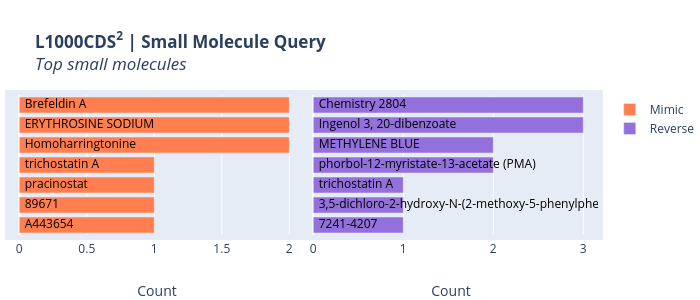

## Series2_A549_Mockvs.Series2_A549_SARS-CoV-2


### Series2_A549_Mockvs.Series2_A549_SARS-CoV-2 signature:

 **L1000CDS<sup>2</sup> Links:**

 *Mimic Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb4c232500041ff672e

 *Reverse Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb4c232500041ff6730

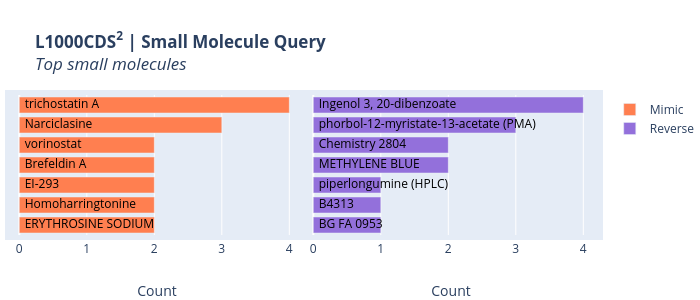

## Series5_A549_Mockvs.Series5_A549_SARS-CoV-2


### Series5_A549_Mockvs.Series5_A549_SARS-CoV-2 signature:

 **L1000CDS<sup>2</sup> Links:**

 *Mimic Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb6c232500041ff6732

 *Reverse Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb6c232500041ff6734

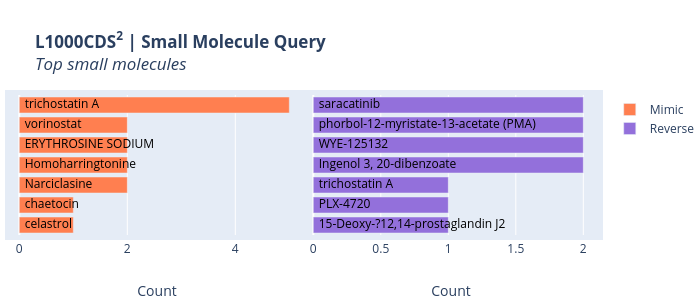

## Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2


### Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2 signature:

 **L1000CDS<sup>2</sup> Links:**

 *Mimic Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb7c232500041ff6736

 *Reverse Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb7c232500041ff6738

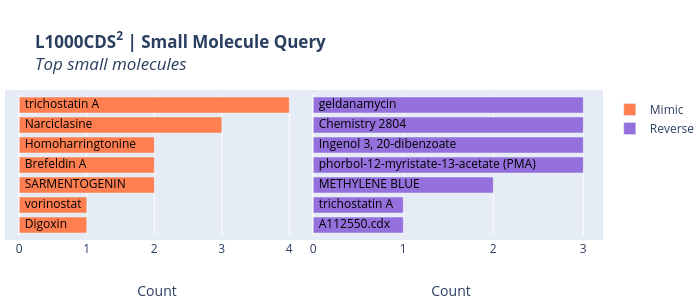

## Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2


### Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2 signature:

 **L1000CDS<sup>2</sup> Links:**

 *Mimic Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb9c232500041ff673a

 *Reverse Signature Query Results*: http://amp.pharm.mssm.edu/L1000CDS2/#/result/5e973fb9c232500041ff673c

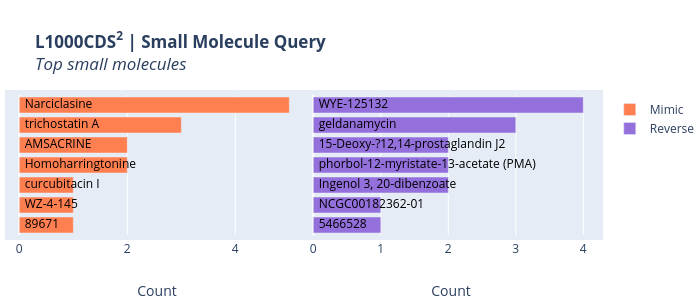

In [33]:
# Initialize results
results['l1000cds2'] = {}

# Loop through signatures
for label, signature in signatures.items():
    display(Markdown("## "+label))
    
    # Run analysis
    results['l1000cds2'][label] = run_l1000cds2(signature=signature, nr_genes=nr_genes, signature_label=label, plot_type=plot_type)

    # Display results
    plot_l1000cds2(results['l1000cds2'][label])

# L1000FWD Query

In [34]:
def run_l1000fwd(signature, nr_genes=500, signature_label=''):
    # Define results
    l1000fwd_results = {'signature_label': signature_label}

    # Define upperGenes Function
    upperGenes = lambda genes: [gene.upper() for gene in genes]

    # Get Data
    payload = {"up_genes":upperGenes(signature.index[:nr_genes]),"down_genes":upperGenes(signature.index[-nr_genes:])}

    # Get URL
    L1000FWD_URL = 'https://amp.pharm.mssm.edu/L1000FWD/'

    # Get result
    response = requests.post(L1000FWD_URL + 'sig_search', json=payload)
    if 'KeyError' in response.text:
        l1000fwd_results['result_url'] = None
    else:
        # Get ID and URL
        result_id = response.json()['result_id']
        l1000fwd_results['result_url'] = 'https://amp.pharm.mssm.edu/l1000fwd/vanilla/result/'+result_id
        l1000fwd_results['result_id'] = result_id

        # Get Top
        l1000fwd_results['signatures'] = requests.get(L1000FWD_URL + 'result/topn/' + result_id).json()


    # Return
    return l1000fwd_results
    
def plot_l1000fwd(l1000fwd_results, nr_drugs=7, height=300):
    
    # Check if results
    if l1000fwd_results['result_url']:

        # Display IFrame
        display(IFrame(l1000fwd_results['result_url'], width="1000", height="1000"))

        # Display tables
        for direction, signature_list in l1000fwd_results['signatures'].items():

            # Fix dataframe
            rename_dict = {'sig_id': 'Signature ID', 'pvals': 'P-value', 'qvals': 'FDR', 'zscores': 'Z-score', 'combined_scores': 'Combined Score'}
            signature_dataframe = pd.DataFrame(signature_list)[list(rename_dict.keys())].rename(columns=rename_dict).sort_values('P-value').rename_axis('Rank')
            signature_dataframe.index = [x + 1 for x in range(len(signature_dataframe.index))]
            signature_txt = signature_dataframe.to_csv(sep='\t')

            # Display table
            pd.set_option('max.colwidth', -1)
            signature_dataframe['Signature ID'] = ['<a href="http://amp.pharm.mssm.edu/dmoa/sig/{x}" target="_blank">{x}</a>'.format(**locals()) for x in signature_dataframe['Signature ID']]
            table_html = signature_dataframe.to_html(escape=False, classes='w-100')
            display(Markdown('** {} Signatures: **'.format(direction.title())))
            display(HTML('<style>.w-100{{width: 100% !important;}}</style><div style="max-height: 250px; overflow-y: auto; margin-bottom: 25px;">{}</div>'.format(table_html)))


In [35]:
# Initialize results
results['l1000fwd'] = {}

# Loop through signatures
for label, signature in signatures.items():
    display(Markdown("## "+label))
    
    # Run analysis
    results['l1000fwd'][label] = run_l1000fwd(signature=signature, signature_label=label, nr_genes=nr_genes)

    # Display results
    plot_l1000fwd(results['l1000fwd'][label])

## Series1_NHBE_Mockvs.Series1_NHBE_SARS-CoV-2

** Similar Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC004_HA1E_24H:BRD-K14920963-304-01-9:10,2.768534e-22,8.266013e-18,-1.626948,35.073328
2,CPC006_NCIH2073_6H:BRD-A20131130-001-01-7:10,1.084011e-19,1.546847e-15,-1.677111,31.806355
3,CPC014_VCAP_24H:BRD-U33728988-000-01-6:10,1.745760e-18,1.494685e-14,-1.726735,30.663385
4,CPC006_HCC515_6H:BRD-K16406336-311-01-2:10,2.659045e-18,1.897184e-14,-1.621648,28.500901
5,CPC017_NPC_24H:BRD-A80502530-001-01-2:10,4.083001e-17,2.184865e-13,-1.773552,29.066778
6,CPC006_VCAP_6H:BRD-K19295594-001-08-5:11.1,7.357522e-17,3.149682e-13,-1.650296,26.624674
7,CPC010_HEPG2_6H:BRD-A24643465-001-05-3:10,7.357522e-17,3.149682e-13,-1.700601,27.436247
8,CPC009_A375_6H:BRD-K21773564-001-01-8:10,1.311112e-16,5.102488e-13,-1.770184,28.114705
9,RAD001_HCC515_6H:BRD-K80738081-001-23-7:0.0412,6.798845e-16,2.425431e-12,-1.834664,27.827379
10,NMH002_NPC_24H:BRD-K32610195-001-14-9:10,1.833057e-15,4.615961e-12,-1.834883,27.040346


** Opposite Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC019_HT29_6H:BRD-K48803730-001-01-1:10,1.359948e-18,1.455451e-14,1.708474,-30.524408
2,CPC013_PC3_24H:BRD-K80786583-001-01-5:10,1.525584e-17,9.329819e-14,1.706455,-28.696715
3,CPC019_HT29_6H:BRD-K71303366-001-01-3:10,7.371184e-16,2.427331e-12,1.682728,-25.463814
4,CPC013_VCAP_24H:BRD-K83643280-001-01-1:10,9.249541e-16,2.708386e-12,1.793961,-26.970194
5,CPC019_A375_6H:BRD-K83816656-001-01-9:10,9.490010e-16,2.708386e-12,1.694811,-25.460692
6,CPC016_NPC_24H:BRD-A76528577-065-01-2:10,2.023445e-15,4.656569e-12,1.648671,-24.225427
7,CPC013_VCAP_6H:BRD-K48950795-001-01-2:10,2.066734e-15,4.656569e-12,1.687742,-24.784016
8,CPC005_PC3_24H:BRD-K13725475-001-02-4:10,1.304192e-14,2.427442e-11,1.855352,-25.760928
9,CPC014_VCAP_6H:BRD-K33551950-001-01-6:10,5.680845e-14,9.007085e-11,1.768418,-23.423738
10,CPC015_NPC_24H:BRD-A55594068-065-03-1:10,6.273430e-14,9.591402e-11,1.665586,-21.989889


## Series2_A549_Mockvs.Series2_A549_SARS-CoV-2

** Similar Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC004_HA1E_24H:BRD-K14920963-304-01-9:10,2.762274e-21,1.182502e-16,-1.626948,33.447980
2,CPC012_HT29_6H:BRD-K63511615-001-01-0:10,3.925704e-19,4.394186e-15,-1.820331,33.505165
3,CPC006_NCIH2073_6H:BRD-A20131130-001-01-7:10,9.565970e-19,6.825160e-15,-1.677192,30.221769
4,NMH002_NPC_24H:BRD-K32610195-001-14-9:10,4.832887e-17,2.068910e-13,-1.835126,29.941536
5,CPC004_HA1E_24H:BRD-A62184259-001-02-8:10,6.542796e-17,2.546278e-13,-1.605234,25.979482
6,CPC017_NPC_24H:BRD-A80502530-001-01-2:10,3.140884e-16,8.403631e-13,-1.773633,27.496542
7,CPC014_VCAP_24H:BRD-U33728988-000-01-6:10,9.805062e-16,1.907931e-12,-1.726252,25.908543
8,CPC015_MCF7_24H:BRD-K14920963-304-01-9:10,1.054305e-15,1.962337e-12,-1.772604,26.548357
9,RAD001_HCC515_6H:BRD-K80738081-001-23-7:0.0412,1.249669e-15,2.203840e-12,-1.834422,27.338768
10,CPC006_HEPG2_6H:BRD-K04853698-003-01-4:10,1.324750e-15,2.203840e-12,-1.678449,24.971743


** Opposite Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC005_PC3_24H:BRD-K13725475-001-02-4:10,1.097389e-20,2.348907e-16,1.856014,-37.045360
2,CPC013_PC3_24H:BRD-K80786583-001-01-5:10,4.105853e-19,4.394186e-15,1.706536,-31.377386
3,CPC010_VCAP_24H:BRD-K92317137-001-08-1:10,8.735436e-19,6.825160e-15,1.756330,-31.717056
4,CPC006_MCF7_6H:BRD-K60219430-001-01-6:10,3.427609e-18,2.096178e-14,1.793358,-31.321008
5,CPC019_HT29_6H:BRD-K48803730-001-01-1:10,1.149749e-17,5.468843e-14,1.707896,-28.930733
6,CPC019_VCAP_24H:BRD-K83816656-001-01-9:10,1.084864e-16,3.870163e-13,1.667762,-26.625192
7,CPC015_NPC_24H:BRD-A55594068-065-03-1:10,1.403374e-16,4.621310e-13,1.665746,-26.406775
8,CPC016_NPC_24H:BRD-A76528577-065-01-2:10,2.616678e-16,7.467824e-13,1.648671,-25.690010
9,CPC019_PC3_24H:BRD-K58479490-001-03-3:10,3.347151e-16,8.428716e-13,1.695046,-26.231394
10,CPC019_A375_6H:BRD-K83816656-001-01-9:10,4.304302e-16,1.023683e-12,1.694239,-26.033841


## Series5_A549_Mockvs.Series5_A549_SARS-CoV-2

** Similar Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC004_HA1E_24H:BRD-K14920963-304-01-9:10,4.179030e-20,1.789001e-15,-1.626948,31.528493
2,CPC006_HCC515_6H:BRD-K16406336-311-01-2:10,3.992740e-18,8.546260e-14,-1.621648,28.214607
3,CPC006_VCAP_6H:BRD-K19295594-001-08-5:11.1,8.928752e-17,9.555774e-13,-1.650457,26.488526
4,CPC012_HT29_6H:BRD-K63511615-001-01-0:10,1.389912e-15,1.190015e-11,-1.820588,27.048496
5,CPC006_NCIH2073_6H:BRD-A20131130-001-01-7:10,1.339119e-13,8.189481e-10,-1.676950,21.587681
6,CPC004_PC3_6H:BRD-K96263742-001-02-3:10,2.684249e-13,1.276778e-09,-1.682081,21.145743
7,CPC006_MCF7_24H:BRD-K61053657-001-01-4:80,5.672509e-12,1.734532e-08,-1.675935,18.847941
8,NMH002_NPC_24H:BRD-K32610195-001-14-9:10,1.516862e-11,4.058459e-08,-1.834721,19.849943
9,CPC015_HT29_6H:BRD-K89375097-300-06-2:10,2.141784e-11,5.093756e-08,-1.811034,19.322332
10,CPC016_HEPG2_6H:BRD-K80348542-001-01-4:10,4.150350e-11,9.351175e-08,-1.793412,18.619055


** Opposite Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC019_A375_6H:BRD-K83816656-001-01-9:10,5.346870e-14,3.814903e-10,1.695219,-22.498783
2,CPC019_A375_6H:BRD-K07005393-001-01-0:10,1.097560e-11,3.132364e-08,1.719531,-18.845323
3,CPC019_HT29_6H:BRD-K48803730-001-01-1:10,1.685003e-11,4.243135e-08,1.708144,-18.402515
4,CPC019_HT29_6H:BRD-K71303366-001-01-3:10,2.266597e-10,3.593732e-07,1.682324,-16.225383
5,CPC004_PC3_6H:BRD-K02265150-001-15-8:10,8.275533e-10,1.142798e-06,1.868704,-16.971946
6,CPC012_VCAP_6H:BRD-K99532291-001-03-1:10,1.428370e-09,1.716091e-06,1.804604,-15.962014
7,CPC019_HT29_6H:BRD-K60067222-001-01-1:10,3.186228e-09,3.383192e-06,1.707099,-14.504745
8,CPC019_MCF7_24H:BRD-K78549347-001-02-6:10,3.240227e-09,3.383192e-06,1.691823,-14.362606
9,CPC016_NPC_24H:BRD-A76528577-065-01-2:10,3.756782e-09,3.655093e-06,1.648514,-13.889033
10,CPC013_VCAP_6H:BRD-K48950795-001-01-2:10,4.582646e-09,4.017700e-06,1.687343,-14.070555


## Series6_A549-ACE2_Mockvs.Series6_A549-ACE2_SARS-CoV-2

** Similar Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC010_HEPG2_6H:BRD-A24643465-001-05-3:10,1.030851e-18,4.412971e-14,-1.701001,30.595579
2,CPC017_HEPG2_6H:BRD-K76674262-001-01-7:10,1.833362e-17,2.616147e-13,-1.804859,30.207474
3,CPC006_NCIH2073_6H:BRD-A20131130-001-01-7:10,3.682638e-17,3.941252e-13,-1.677031,27.560054
4,CPC012_HT29_6H:BRD-K63511615-001-01-0:10,7.860908e-17,5.608627e-13,-1.819647,29.304550
5,CPC014_VCAP_24H:BRD-U33728988-000-01-6:10,1.261758e-16,7.716372e-13,-1.726654,27.452121
6,CPC004_HA1E_24H:BRD-K14920963-304-01-9:10,1.543418e-16,8.259023e-13,-1.626788,25.721985
7,CPC017_HEPG2_6H:BRD-A25687296-300-03-5:10,1.393346e-15,5.422522e-12,-1.810012,26.889438
8,NMH002_NPC_24H:BRD-K32610195-001-14-9:10,6.475053e-15,2.132235e-11,-1.834478,26.028958
9,RAD001_HCC515_6H:BRD-K80738081-001-23-7:0.0412,9.673624e-15,2.588239e-11,-1.834422,25.708345
10,CPC017_NPC_24H:BRD-A80502530-001-01-2:10,9.673624e-15,2.588239e-11,-1.773146,24.849590


** Opposite Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC019_A375_6H:BRD-K83816656-001-01-9:10,1.286120e-17,2.616147e-13,1.695301,-28.634853
2,CPC001_PC3_24H:BRD-A06276885-003-01-1:10,6.057226e-15,2.132235e-11,1.914941,-27.226110
3,CPC019_HT29_6H:BRD-K71303366-001-01-3:10,1.045760e-14,2.633408e-11,1.682808,-23.526618
4,CPC013_PC3_24H:BRD-K80786583-001-01-5:10,1.393488e-14,3.314103e-11,1.706375,-23.643354
5,CPC002_PC3_24H:BRD-K53523901-001-02-8:10,1.938324e-13,3.319108e-10,1.827804,-23.236089
6,CPC013_VCAP_6H:BRD-K48950795-001-01-2:10,3.708214e-13,5.120805e-10,1.687742,-20.980047
7,CPC014_VCAP_24H:BRD-A11007541-003-01-9:10,9.087969e-13,1.115667e-09,1.724469,-20.765250
8,CPC019_A375_6H:BRD-K07005393-001-01-0:10,9.121530e-13,1.115667e-09,1.718542,-20.691123
9,CPC016_NPC_24H:BRD-A76528577-065-01-2:10,1.187290e-12,1.373695e-09,1.648593,-19.660198
10,CPC019_HT29_6H:BRD-K48803730-001-01-1:10,1.427854e-12,1.608552e-09,1.706989,-20.219822


## Series7_Calu3_Mockvs.Series7_Calu3_SARS-CoV-2

** Similar Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC012_HT29_6H:BRD-K63511615-001-01-0:10,4.885768e-22,2.091548e-17,-1.820417,38.795022
2,CVD001_PHH_24H:BRD-K03067624-001-01-5:10,2.012247e-21,4.307115e-17,-1.774319,36.721873
3,CPC006_HCC515_6H:BRD-K16406336-311-01-2:10,4.809522e-21,5.533021e-17,-1.621727,32.950079
4,CPC017_HEPG2_6H:BRD-A25687296-300-03-5:10,5.169961e-21,5.533021e-17,-1.810750,36.733807
5,CPC004_HA1E_24H:BRD-K14920963-304-01-9:10,1.431641e-20,1.225743e-16,-1.626788,32.282251
6,CPC002_PC3_24H:BRD-K08547377-003-03-2:10,3.651837e-19,2.605524e-15,-1.625803,29.975731
7,CPC006_A375_6H:BRD-K08845546-001-02-2:22.2,6.518731e-19,3.986577e-15,-1.655393,30.104701
8,CVD001_HEPG2_24H:BRD-K03067624-001-01-5:10,9.541350e-19,5.105696e-15,-1.804203,32.512438
9,CPC010_HEPG2_6H:BRD-A24643465-001-05-3:10,7.880140e-18,3.748232e-14,-1.700520,29.084795
10,CPD002_PC3_24H:BRD-K08547377-394-01-9:10,1.909135e-16,5.448543e-13,-1.795945,28.230752


** Opposite Signatures: **

,Signature ID,P-value,FDR,Z-score,Combined Score
1,CPC006_PC3_24H:BRD-K52075040-001-03-0:44.4,8.009251e-17,2.637446e-13,1.798151,-28.943778
2,CPC012_A375_6H:BRD-K15475572-001-01-8:10,2.629892e-16,7.036441e-13,1.772882,-27.621618
3,CPC019_A375_6H:BRD-K83816656-001-01-9:10,3.466516e-16,8.244337e-13,1.695056,-26.205747
4,CPC012_VCAP_6H:BRD-K42308740-001-01-5:10,1.789951e-15,3.648858e-12,1.855330,-27.360853
5,MUC.CP003_MCF7_6H:BRD-K98714523-001-01-0:10.3698,3.228618e-15,5.970461e-12,1.590837,-23.052799
6,CPC013_VCAP_24H:BRD-K83643280-001-01-1:10,4.445223e-15,7.047983e-12,1.793793,-25.744715
7,CPC019_A375_6H:BRD-K07005393-001-01-0:10,5.745054e-15,8.480691e-12,1.719119,-24.481464
8,CPC005_MCF7_24H:BRD-A49225603-045-05-0:10,2.552131e-14,2.540795e-11,1.849361,-25.138542
9,CPC019_HT29_6H:BRD-K69159985-001-01-4:10,1.903117e-13,1.394076e-10,1.678998,-21.357753
10,CPC014_VCAP_24H:BRD-A11007541-003-01-9:10,4.217850e-12,2.099557e-09,1.723485,-19.604487
